In [57]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline 
import warnings
warnings.filterwarnings('ignore')

In [58]:
from sklearn.model_selection import train_test_split

In [59]:
import statsmodels.api as sm
from sklearn.metrics import mean_absolute_error,mean_squared_error
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [60]:
df =  pd.read_excel('compactiv.xlsx')

In [61]:
df.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.4,NaN,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.2,NaN,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.4,NaN,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90


In [62]:
df.tail()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
8187,16,12,3009,360,244,1.6,5.81,405250.0,85282.0,8.02,...,55.11,0.6,35.87,47.90,139.28,270.74,CPU_Bound,387,986647,80
8188,4,0,1596,170,146,2.4,1.80,89489.0,41764.0,3.80,...,0.20,0.8,3.80,4.40,122.40,212.60,Not_CPU_Bound,263,1055742,90
8189,16,5,3116,289,190,0.6,0.60,325948.0,52640.0,0.40,...,0.00,0.4,28.40,45.20,60.20,219.80,Not_CPU_Bound,400,969106,87
8190,32,45,5180,254,179,1.2,1.20,62571.0,29505.0,1.40,...,18.04,0.4,23.05,24.25,93.19,202.81,CPU_Bound,141,1022458,83
8191,2,0,985,55,46,1.6,4.80,111111.0,22256.0,0.00,...,0.00,0.2,3.40,6.20,91.80,110.00,CPU_Bound,659,1756514,94


In [63]:
df.shape

(8192, 22)

So There are 22 columns and 8192 rows

In [64]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lread     8192 non-null   int64  
 1   lwrite    8192 non-null   int64  
 2   scall     8192 non-null   int64  
 3   sread     8192 non-null   int64  
 4   swrite    8192 non-null   int64  
 5   fork      8192 non-null   float64
 6   exec      8192 non-null   float64
 7   rchar     8088 non-null   float64
 8   wchar     8177 non-null   float64
 9   pgout     8192 non-null   float64
 10  ppgout    8192 non-null   float64
 11  pgfree    8192 non-null   float64
 12  pgscan    8192 non-null   float64
 13  atch      8192 non-null   float64
 14  pgin      8192 non-null   float64
 15  ppgin     8192 non-null   float64
 16  pflt      8192 non-null   float64
 17  vflt      8192 non-null   float64
 18  runqsz    8192 non-null   object 
 19  freemem   8192 non-null   int64  
 20  freeswap  8192 non-null   int6

There are float , int and object data types

In [65]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
lread,8192.0,NaN,NaN,NaN,19.559692,53.353799,0.0,2.0,7.0,20.0,1845.0
lwrite,8192.0,NaN,NaN,NaN,13.106201,29.891726,0.0,0.0,1.0,10.0,575.0
scall,8192.0,NaN,NaN,NaN,2306.318237,1633.617322,109.0,1012.0,2051.5,3317.25,12493.0
sread,8192.0,NaN,NaN,NaN,210.47998,198.980146,6.0,86.0,166.0,279.0,5318.0
swrite,8192.0,NaN,NaN,NaN,150.058228,160.47898,7.0,63.0,117.0,185.0,5456.0
fork,8192.0,NaN,NaN,NaN,1.884554,2.479493,0.0,0.4,0.8,2.2,20.12
exec,8192.0,NaN,NaN,NaN,2.791998,5.212456,0.0,0.2,1.2,2.8,59.56
rchar,8088.0,NaN,NaN,NaN,197385.728363,239837.493526,278.0,34091.5,125473.5,267828.75,2526649.0
wchar,8177.0,NaN,NaN,NaN,95902.992785,140841.707911,1498.0,22916.0,46619.0,106101.0,1801623.0
pgout,8192.0,NaN,NaN,NaN,2.285317,5.307038,0.0,0.0,0.0,2.4,81.44


In [66]:
df.isna().sum()

lread         0
lwrite        0
scall         0
sread         0
swrite        0
fork          0
exec          0
rchar       104
wchar        15
pgout         0
ppgout        0
pgfree        0
pgscan        0
atch          0
pgin          0
ppgin         0
pflt          0
vflt          0
runqsz        0
freemem       0
freeswap      0
usr           0
dtype: int64

There are null values for rchar (104 nulls) and wchar (15 nulls)

In [67]:
df.duplicated().sum()

0

No Duplicated Data 

In [68]:
df.runqsz.value_counts()

Not_CPU_Bound    4331
CPU_Bound        3861
Name: runqsz, dtype: int64

## Univariate Analysis

In [69]:
num_df = df.select_dtypes(['int64','float64']).columns
obj_df = df.select_dtypes(['object']).columns

In [70]:
num_df

Index(['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin',
       'pflt', 'vflt', 'freemem', 'freeswap', 'usr'],
      dtype='object')

In [71]:
obj_df

Index(['runqsz'], dtype='object')

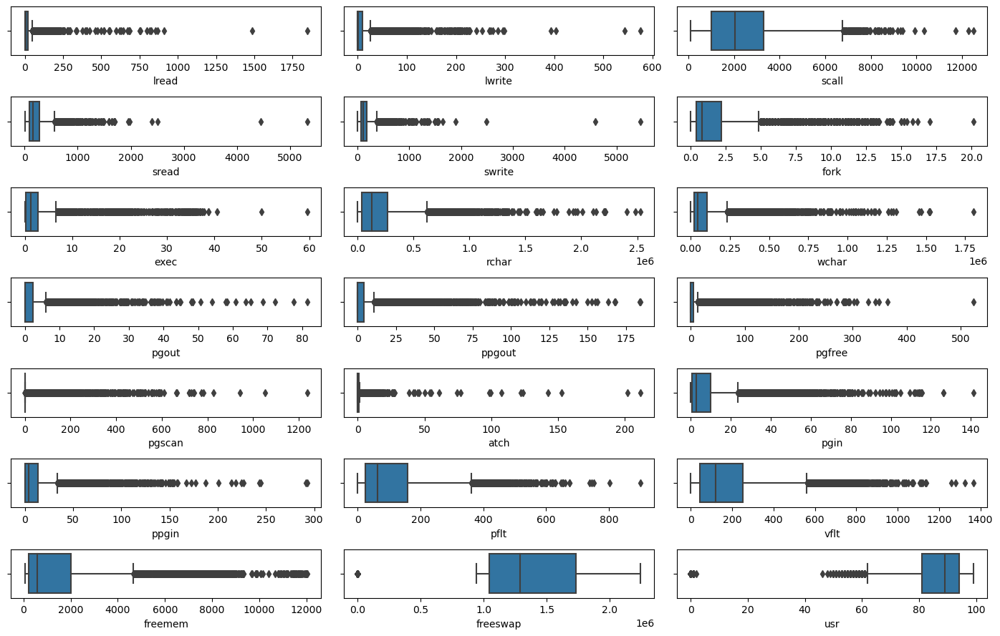

In [72]:
plt.figure(figsize = (14,9))
for i in range(0,len(num_df)):
    plt.subplot(7,3,i+1)
    sns.boxplot(df[num_df[i]])
plt.tight_layout()

The data seems to be skewed for all the features and has outliers

## Bivariate Analysis

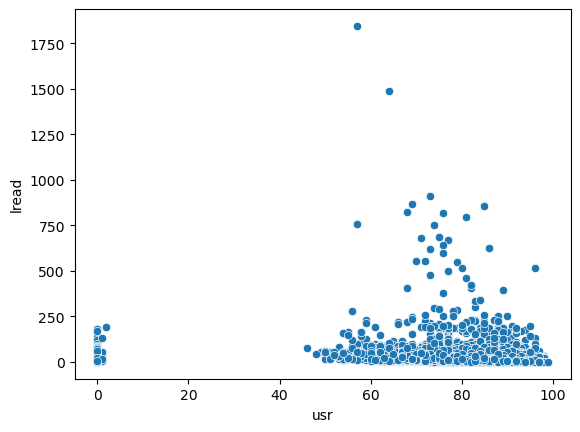

In [73]:
sns.scatterplot(x=df['usr'],y=df['lread']);

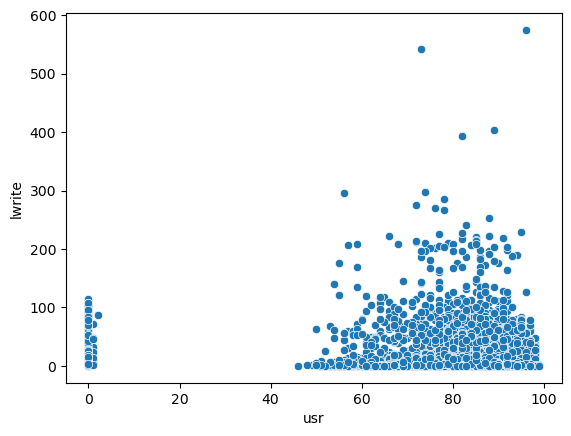

In [74]:
sns.scatterplot(x=df['usr'],y=df['lwrite']);

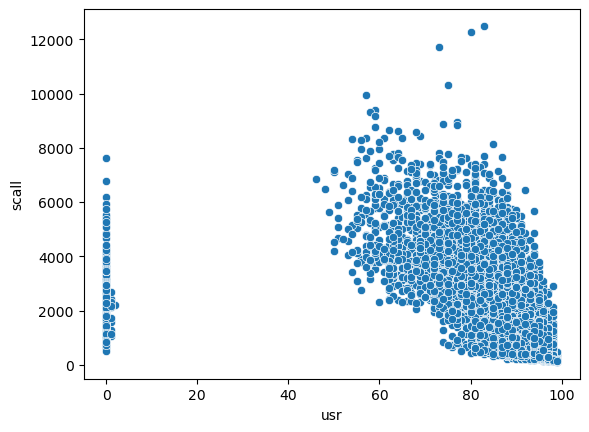

In [75]:
sns.scatterplot(x=df['usr'],y=df['scall']);

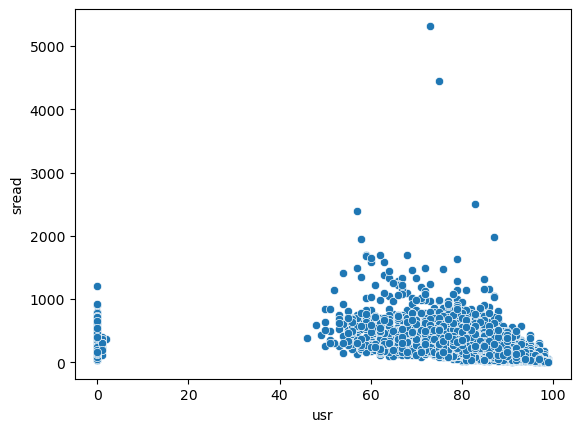

In [76]:
sns.scatterplot(x=df['usr'],y=df['sread']);

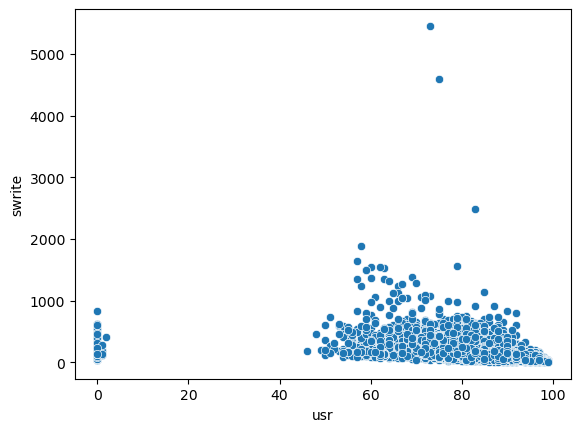

In [77]:
sns.scatterplot(x=df['usr'],y=df['swrite']);

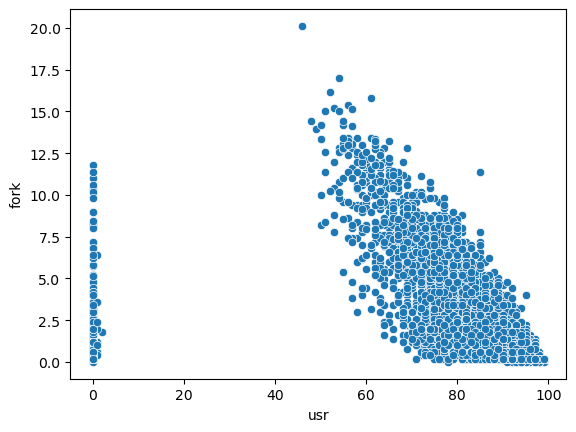

In [78]:
sns.scatterplot(x=df['usr'],y=df['fork']);

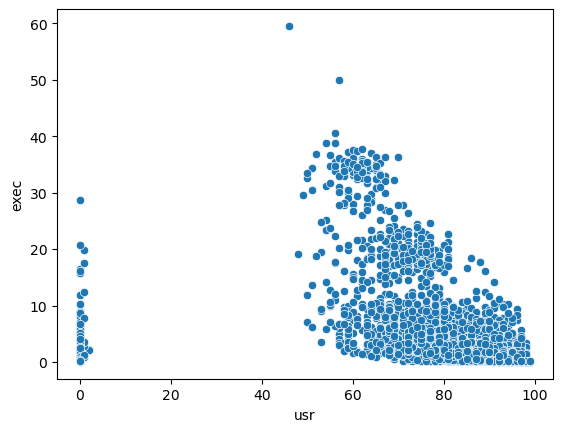

In [79]:
sns.scatterplot(x=df['usr'],y=df['exec']);

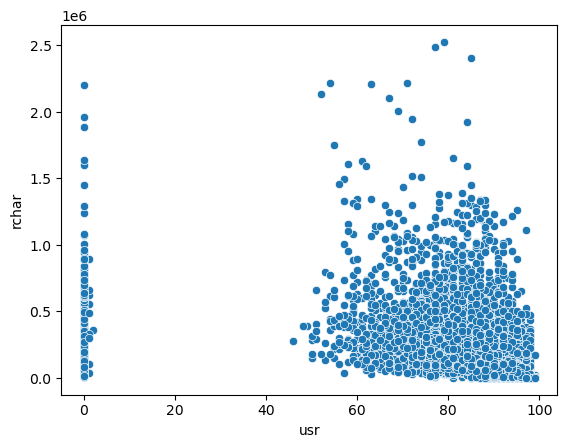

In [80]:
sns.scatterplot(x=df['usr'],y=df['rchar']);

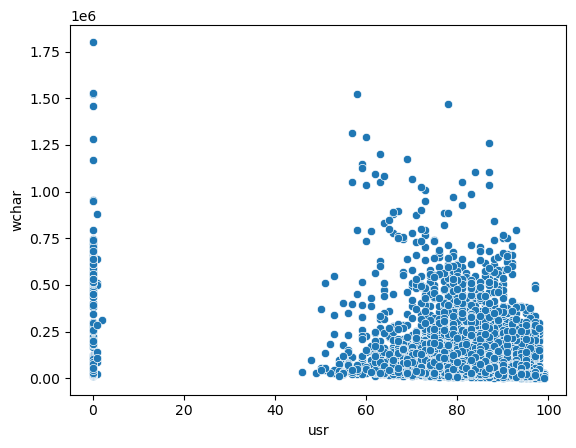

In [81]:
sns.scatterplot(x=df['usr'],y=df['wchar']);

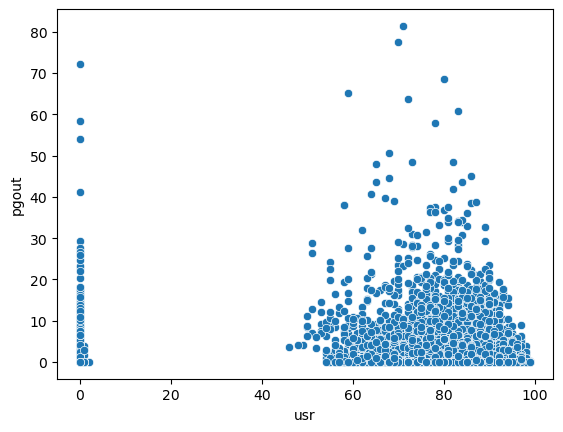

In [82]:
sns.scatterplot(x=df['usr'],y=df['pgout']);

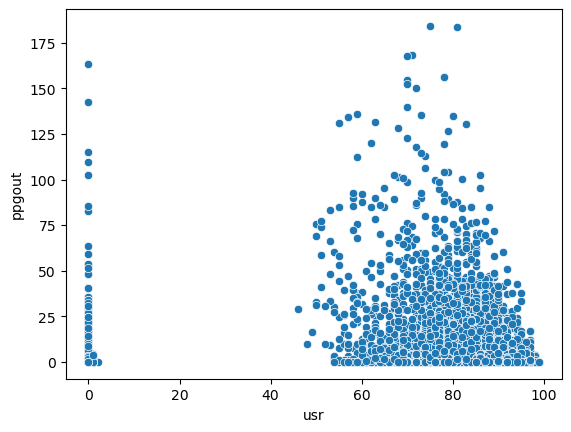

In [83]:
sns.scatterplot(x=df['usr'],y=df['ppgout']);

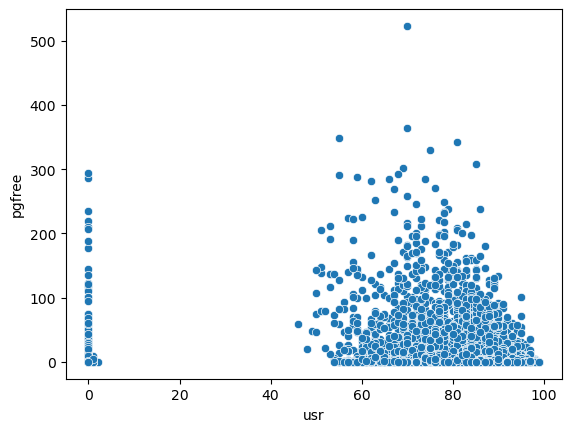

In [84]:
sns.scatterplot(x=df['usr'],y=df['pgfree']);

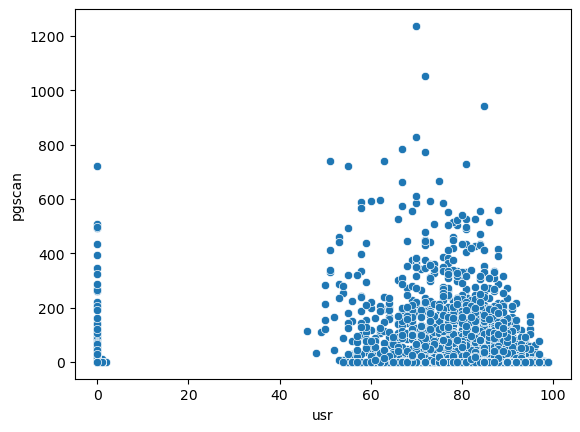

In [85]:
sns.scatterplot(x=df['usr'],y=df['pgscan']);

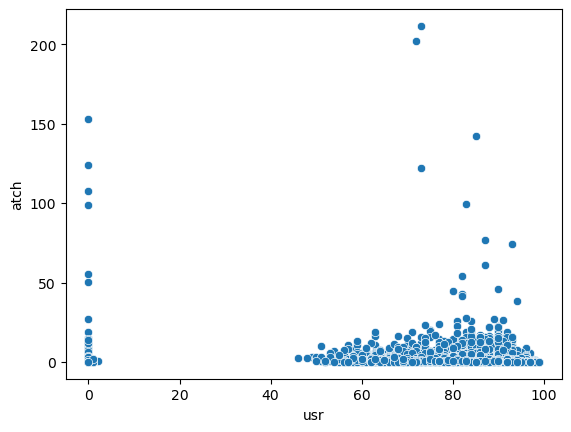

In [86]:
sns.scatterplot(x=df['usr'],y=df['atch']);

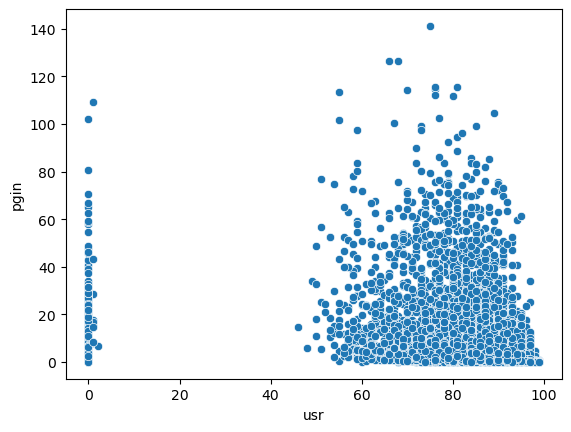

In [87]:
sns.scatterplot(x=df['usr'],y=df['pgin']);

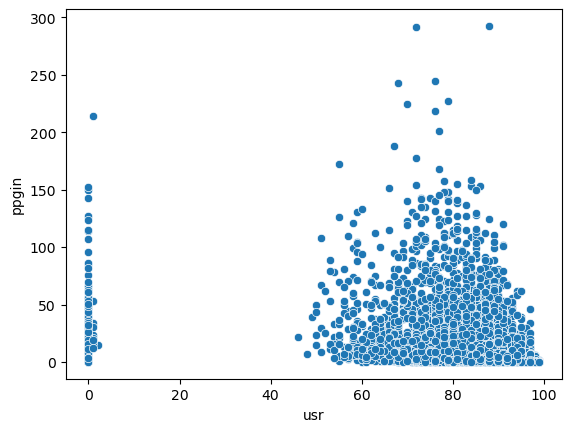

In [88]:
sns.scatterplot(x=df['usr'],y=df['ppgin']);

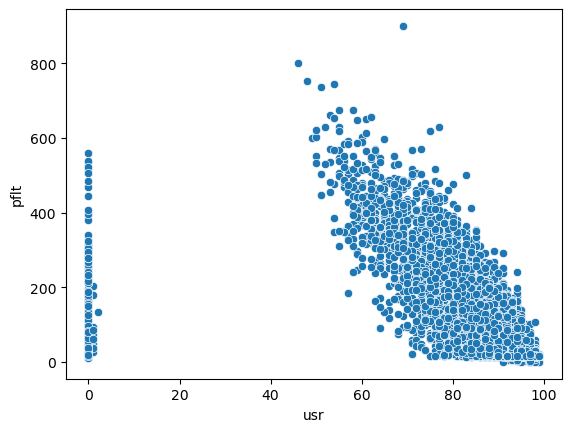

In [89]:
sns.scatterplot(x=df['usr'],y=df['pflt']);

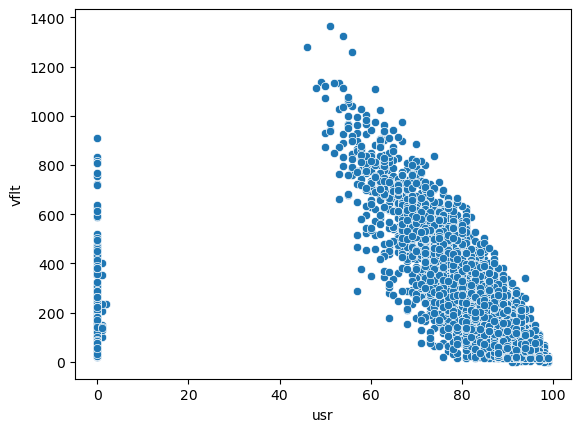

In [90]:
sns.scatterplot(x=df['usr'],y=df['vflt']);

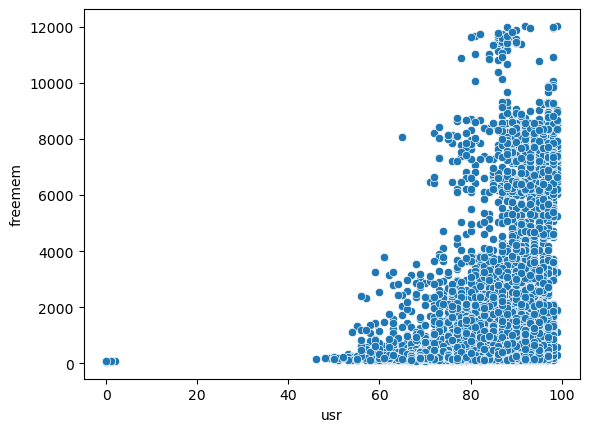

In [91]:
sns.scatterplot(x=df['usr'],y=df['freemem']);

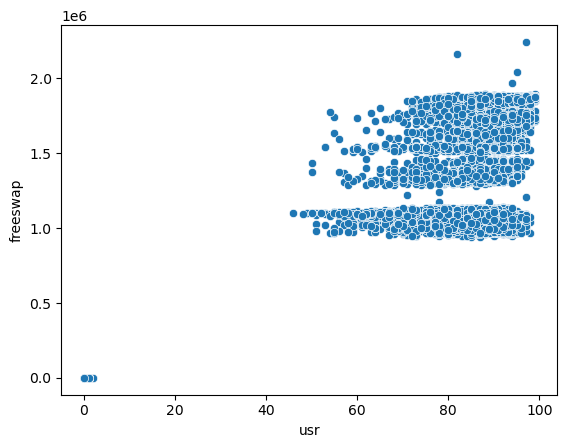

In [92]:
sns.scatterplot(x=df['usr'],y=df['freeswap']);

multicollinearity check based on correlation heatmap

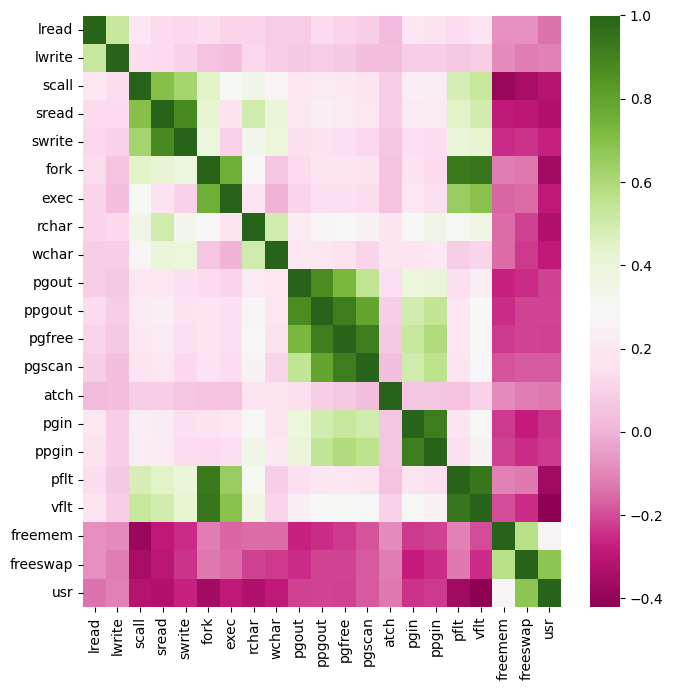

In [93]:
plt.figure(figsize=(7,7))
sns.heatmap(np.round(df[num_df].corr(),2),cmap="PiYG")
plt.tight_layout()

In [94]:
df[['pgout','ppgout','pgfree','pgscan']].corr()

,pgout,ppgout,pgfree,pgscan
pgout,1.000000,0.872445,0.730381,0.553916
ppgout,0.872445,1.000000,0.917790,0.785256
pgfree,0.730381,0.917790,1.000000,0.915217
pgscan,0.553916,0.785256,0.915217,1.000000


(swrite,sread) ,(fork,exec),  (pgin,ppgin)  ,(pflt,vflt) , (pgout,ppgout,pgfree,pgscan) have high correlation , hence there is multi collinearity in the data 

<AxesSubplot:xlabel='runqsz', ylabel='usr'>

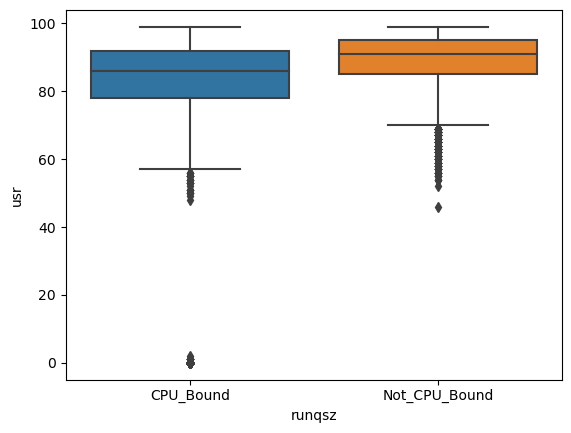

In [95]:
sns.boxplot(data=df,x='runqsz',y='usr')
# CPU_bound cpus run in user mode about 85% of time , where as Non CPU Bound CPUS run  in user mode about 90 % of the time 

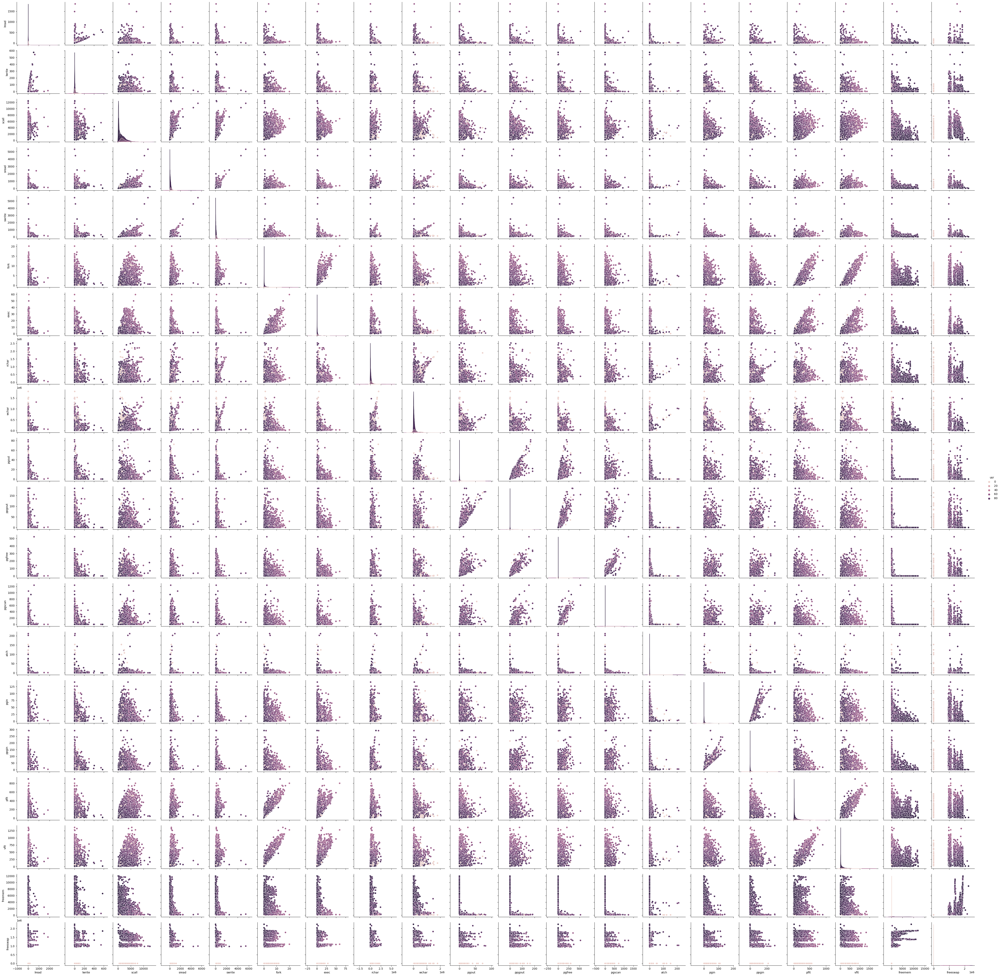

In [96]:
sns.pairplot(data=df, hue='usr', diag_kind='kde')

## Multivariate Analysis

In [97]:
np.round(df[num_df].corr(),2)

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgfree,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr
lread,1.00,0.53,0.19,0.13,0.12,0.14,0.11,0.11,0.08,0.08,...,0.11,0.09,0.02,0.19,0.16,0.14,0.17,-0.08,-0.08,-0.14
lwrite,0.53,1.00,0.14,0.13,0.10,0.05,0.04,0.12,0.09,0.07,...,0.07,0.04,0.03,0.09,0.09,0.07,0.09,-0.09,-0.12,-0.11
scall,0.19,0.14,1.00,0.70,0.62,0.45,0.31,0.35,0.27,0.19,...,0.20,0.18,0.08,0.24,0.22,0.48,0.53,-0.39,-0.35,-0.32
sread,0.13,0.13,0.70,1.00,0.88,0.42,0.16,0.50,0.40,0.19,...,0.21,0.19,0.09,0.21,0.21,0.45,0.49,-0.29,-0.30,-0.33
swrite,0.12,0.10,0.62,0.88,1.00,0.38,0.10,0.33,0.39,0.15,...,0.15,0.12,0.06,0.15,0.14,0.40,0.42,-0.25,-0.24,-0.27
fork,0.14,0.05,0.45,0.42,0.38,1.00,0.76,0.28,0.06,0.13,...,0.17,0.16,0.05,0.16,0.13,0.93,0.94,-0.12,-0.13,-0.36
exec,0.11,0.04,0.31,0.16,0.10,0.76,1.00,0.17,0.00,0.11,...,0.15,0.14,0.05,0.19,0.15,0.65,0.69,-0.16,-0.15,-0.29
rchar,0.11,0.12,0.35,0.50,0.33,0.28,0.17,1.00,0.50,0.21,...,0.28,0.26,0.17,0.30,0.35,0.31,0.36,-0.15,-0.22,-0.33
wchar,0.08,0.09,0.27,0.40,0.39,0.06,0.00,0.50,1.00,0.19,...,0.16,0.11,0.18,0.18,0.20,0.09,0.11,-0.15,-0.23,-0.29
pgout,0.08,0.07,0.19,0.19,0.15,0.13,0.11,0.21,0.19,1.00,...,0.73,0.55,0.15,0.39,0.41,0.15,0.23,-0.27,-0.25,-0.22


vflt has the highest negative  correation (-0.42) with usr and freeswap has the highest positive correlation (0.68) among other features 

<AxesSubplot:title={'center':'usr vs freeswap'}, xlabel='usr', ylabel='freeswap'>

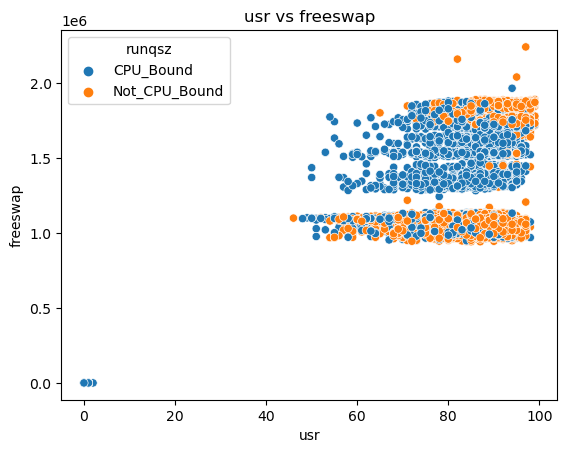

In [98]:
plt.title('usr vs freeswap')
sns.scatterplot(data=df, x='usr', y='freeswap', hue='runqsz')


<AxesSubplot:title={'center':'usr vs vflt'}, xlabel='usr', ylabel='vflt'>

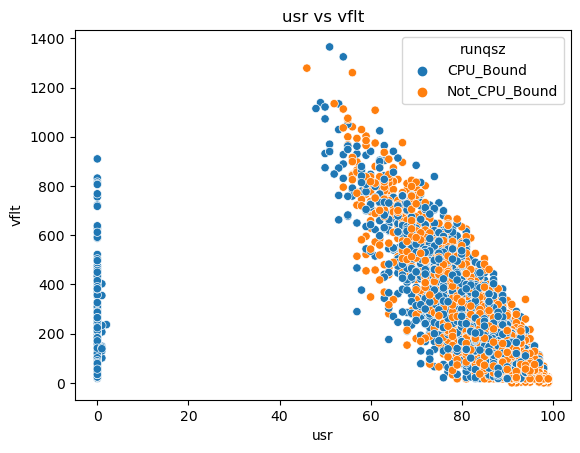

In [99]:
plt.title('usr vs vflt')
sns.scatterplot(data=df, x='usr', y='vflt', hue='runqsz')

## 1.2 Impute null values if present, also check for the values which are equal to zero. Do they have any meaning or do we need to change them or drop them? Check for the possibility of creating new features if required. Also check for outliers and duplicates if there.

In [100]:
df.isna().sum()
# rchar       104
# wchar        15 have nulls , these needs to get imputed using median 

lread         0
lwrite        0
scall         0
sread         0
swrite        0
fork          0
exec          0
rchar       104
wchar        15
pgout         0
ppgout        0
pgfree        0
pgscan        0
atch          0
pgin          0
ppgin         0
pflt          0
vflt          0
runqsz        0
freemem       0
freeswap      0
usr           0
dtype: int64

In [101]:
for column in df.columns:
    if df[column].dtype != 'object':
        median = df[column].median()
        df[column] = df[column].fillna(median)    
        
df.isnull().sum()      

lread       0
lwrite      0
scall       0
sread       0
swrite      0
fork        0
exec        0
rchar       0
wchar       0
pgout       0
ppgout      0
pgfree      0
pgscan      0
atch        0
pgin        0
ppgin       0
pflt        0
vflt        0
runqsz      0
freemem     0
freeswap    0
usr         0
dtype: int64

In [102]:
df.duplicated().sum()
# No Duplicates 

0

In [103]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
lread,8192.0,1.955969e+01,53.353799,0.0,2.00,7.0,20.000,1845.00
lwrite,8192.0,1.310620e+01,29.891726,0.0,0.00,1.0,10.000,575.00
scall,8192.0,2.306318e+03,1633.617322,109.0,1012.00,2051.5,3317.250,12493.00
sread,8192.0,2.104800e+02,198.980146,6.0,86.00,166.0,279.000,5318.00
swrite,8192.0,1.500582e+02,160.478980,7.0,63.00,117.0,185.000,5456.00
fork,8192.0,1.884554e+00,2.479493,0.0,0.40,0.8,2.200,20.12
exec,8192.0,2.791998e+00,5.212456,0.0,0.20,1.2,2.800,59.56
rchar,8192.0,1.964728e+05,238446.012054,278.0,34860.50,125473.5,265394.750,2526649.00
wchar,8192.0,9.581275e+04,140728.464118,1498.0,22977.75,46619.0,106037.000,1801623.00
pgout,8192.0,2.285317e+00,5.307038,0.0,0.00,0.0,2.400,81.44


The values equal to Zero 0 are valid data points so i choose to leave it as it is 

##### Since Outliers can seriously impact the Linear Regresssion we choose to treat the outliers using the Inter Quartile Distance or IQR

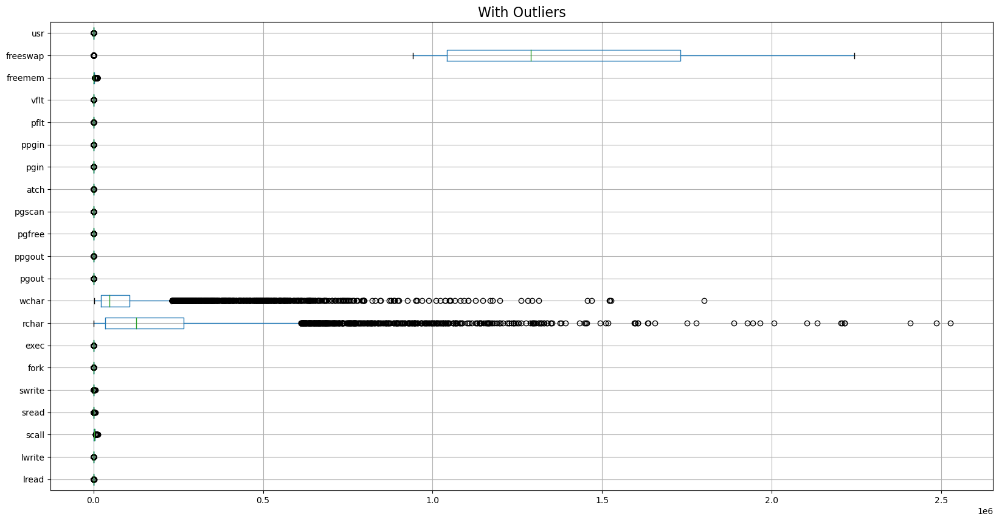

In [104]:
# construct box plot for continuous variables
cont=df.dtypes[(df.dtypes!='object')].index
plt.figure(figsize=(20,10))
df[cont].boxplot(vert=0)
plt.title('With Outliers',fontsize=16)
plt.show()

In [105]:
def outlier_fix(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [106]:
for column in df[cont].columns:
    lr,ur=outlier_fix(df[column])
    df[column]=np.where(df[column]>ur,ur,df[column])
    df[column]=np.where(df[column]<lr,lr,df[column])

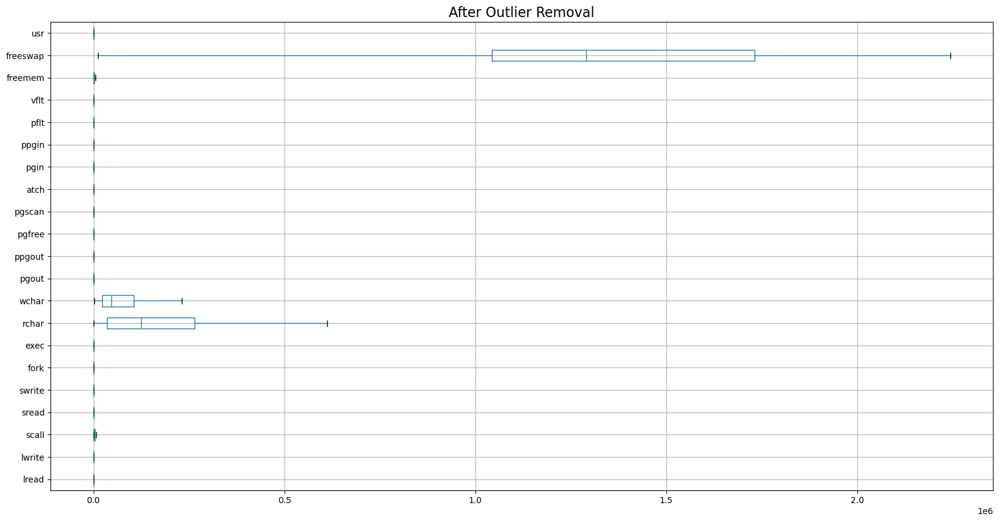

In [107]:
plt.figure(figsize=(20,10))
df[cont].boxplot(vert=0)
plt.title('After Outlier Removal',fontsize=16)
plt.show()

In [108]:
df.duplicated().sum()
# No Duplicates 

0

In [109]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
lread,8192.0,1.342285e+01,15.159741,0.0,2.00,7.0,20.000,4.700000e+01
lwrite,8192.0,6.657471e+00,9.291945,0.0,0.00,1.0,10.000,2.500000e+01
scall,8192.0,2.294484e+03,1593.093446,109.0,1012.00,2051.5,3317.250,6.775125e+03
sread,8192.0,1.997764e+02,146.758932,6.0,86.00,166.0,279.000,5.685000e+02
swrite,8192.0,1.379700e+02,97.141835,7.0,63.00,117.0,185.000,3.680000e+02
fork,8192.0,1.557771e+00,1.591220,0.0,0.40,0.8,2.200,4.900000e+00
exec,8192.0,1.931495e+00,2.028253,0.0,0.20,1.2,2.800,6.700000e+00
rchar,8192.0,1.788841e+05,174589.212910,278.0,34860.50,125473.5,265394.750,6.111961e+05
wchar,8192.0,7.564554e+04,71262.958027,1498.0,22977.75,46619.0,106037.000,2.306259e+05
pgout,8192.0,1.420901e+00,2.200251,0.0,0.00,0.0,2.400,6.000000e+00


## 1.3 Encode the data (having string values) for Modelling. Split the data into train and test (70:30). Apply Linear regression using scikit learn. Perform checks for significant variables using appropriate method from statsmodel. Create multiple models and check the performance of Predictions on Train and Test sets using Rsquare, RMSE & Adj Rsquare. Compare these models and select the best one with appropriate reasoning.

In [117]:
pd.Categorical(df.runqsz.unique())

['CPU_Bound', 'Not_CPU_Bound']
Categories (2, object): ['CPU_Bound', 'Not_CPU_Bound']

In [119]:
pd.Categorical(df.runqsz.unique()).codes

array([0, 1], dtype=int8)

The Runqsz is a nominal datatype , hence dummy variable encoding is prefered

In [120]:
df = pd.get_dummies(df, columns=['runqsz'],drop_first=True)

In [121]:
df

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr,runqsz_Not_CPU_Bound
0,1.0,0.0,2147.0,79.0,68.0,0.2,0.20,40671.0,53995.0,0.0,...,0.0,0.0,1.6000,2.60,16.00,26.40,4659.125,1730946.0,95.0,0
1,0.0,0.0,170.0,18.0,21.0,0.2,0.20,448.0,8385.0,0.0,...,0.0,0.0,0.0000,0.00,15.63,16.83,4659.125,1869002.0,97.0,1
2,15.0,3.0,2162.0,159.0,119.0,2.0,2.40,125473.5,31950.0,0.0,...,0.0,1.2,6.0000,9.40,150.20,220.20,702.000,1021237.0,87.0,1
3,0.0,0.0,160.0,12.0,16.0,0.2,0.20,125473.5,8670.0,0.0,...,0.0,0.0,0.2000,0.20,15.60,16.80,4659.125,1863704.0,98.0,1
4,5.0,1.0,330.0,39.0,38.0,0.4,0.40,125473.5,12185.0,0.0,...,0.0,0.0,1.0000,1.20,37.80,47.60,633.000,1760253.0,90.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8187,16.0,12.0,3009.0,360.0,244.0,1.6,5.81,405250.0,85282.0,6.0,...,0.0,0.6,23.5125,33.60,139.28,270.74,387.000,986647.0,80.0,0
8188,4.0,0.0,1596.0,170.0,146.0,2.4,1.80,89489.0,41764.0,3.8,...,0.0,0.8,3.8000,4.40,122.40,212.60,263.000,1055742.0,90.0,1
8189,16.0,5.0,3116.0,289.0,190.0,0.6,0.60,325948.0,52640.0,0.4,...,0.0,0.4,23.5125,33.60,60.20,219.80,400.000,969106.0,87.0,1
8190,32.0,25.0,5180.0,254.0,179.0,1.2,1.20,62571.0,29505.0,1.4,...,0.0,0.4,23.0500,24.25,93.19,202.81,141.000,1022458.0,83.0,0


In [126]:
dfc = df.copy()
from sklearn.preprocessing import StandardScaler
X = StandardScaler()
dfc = X.fit_transform(dfc)

In [128]:
dfc =  pd.DataFrame(dfc,columns=df.columns)

In [130]:
dfc.describe()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr,runqsz_Not_CPU_Bound
count,8.192000e+03,8.192000e+03,8.192000e+03,8.192000e+03,8.192000e+03,8.192000e+03,8.192000e+03,8.192000e+03,8.192000e+03,8.192000e+03,...,8192.0,8.192000e+03,8.192000e+03,8.192000e+03,8.192000e+03,8.192000e+03,8.192000e+03,8.192000e+03,8.192000e+03,8.192000e+03
mean,-1.635790e-17,1.182594e-16,-4.025101e-18,5.826231e-17,-6.003770e-18,9.230965e-18,-9.240113e-17,8.571973e-18,1.544988e-18,-2.650468e-16,...,0.0,-2.078483e-16,-1.074783e-16,2.791346e-16,2.315788e-17,-7.817098e-17,1.083931e-16,-4.941251e-17,4.567202e-18,2.074079e-16
std,1.000061e+00,1.000061e+00,1.000061e+00,1.000061e+00,1.000061e+00,1.000061e+00,1.000061e+00,1.000061e+00,1.000061e+00,1.000061e+00,...,0.0,1.000061e+00,1.000061e+00,1.000061e+00,1.000061e+00,1.000061e+00,1.000061e+00,1.000061e+00,1.000061e+00,1.000061e+00
min,-8.854815e-01,-7.165214e-01,-1.371933e+00,-1.320452e+00,-1.348317e+00,-9.790389e-01,-9.523530e-01,-1.023070e+00,-1.040542e+00,-6.458297e-01,...,0.0,-6.897803e-01,-8.309868e-01,-8.190176e-01,-1.040313e+00,-1.079608e+00,-8.299516e-01,-3.131333e+00,-2.538597e+00,-1.059118e+00
25%,-7.535451e-01,-7.165214e-01,-8.050764e-01,-7.753076e-01,-7.718049e-01,-7.276441e-01,-8.537400e-01,-8.249786e-01,-7.391078e-01,-6.458297e-01,...,0.0,-6.897803e-01,-7.529020e-01,-7.652553e-01,-7.941108e-01,-8.014325e-01,-7.203397e-01,-6.794809e-01,-5.381844e-01,-1.059118e+00
50%,-4.237040e-01,-6.088947e-01,-1.525324e-01,-2.301627e-01,-2.158828e-01,-4.762492e-01,-3.606748e-01,-3.059401e-01,-4.073408e-01,-6.458297e-01,...,0.0,-6.897803e-01,-4.665909e-01,-4.785233e-01,-4.120052e-01,-3.398575e-01,-5.036071e-01,-9.323761e-02,2.824977e-01,9.441822e-01
75%,4.338827e-01,3.597453e-01,6.420395e-01,5.398545e-01,4.841673e-01,4.036326e-01,4.282293e-01,4.955401e-01,4.264953e-01,4.450214e-01,...,0.0,3.761243e-01,4.398439e-01,4.175144e-01,5.314413e-01,4.688221e-01,3.827855e-01,9.550871e-01,7.954239e-01,9.441822e-01
max,2.215024e+00,1.974145e+00,2.812713e+00,2.512598e+00,2.368126e+00,2.100548e+00,2.351183e+00,2.476318e+00,2.174900e+00,2.081298e+00,...,0.0,1.974981e+00,2.228963e+00,2.191669e+00,2.519770e+00,2.374204e+00,2.037473e+00,2.173861e+00,1.308350e+00,9.441822e-01


Split

In [131]:
df

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr,runqsz_Not_CPU_Bound
0,1.0,0.0,2147.0,79.0,68.0,0.2,0.20,40671.0,53995.0,0.0,...,0.0,0.0,1.6000,2.60,16.00,26.40,4659.125,1730946.0,95.0,0
1,0.0,0.0,170.0,18.0,21.0,0.2,0.20,448.0,8385.0,0.0,...,0.0,0.0,0.0000,0.00,15.63,16.83,4659.125,1869002.0,97.0,1
2,15.0,3.0,2162.0,159.0,119.0,2.0,2.40,125473.5,31950.0,0.0,...,0.0,1.2,6.0000,9.40,150.20,220.20,702.000,1021237.0,87.0,1
3,0.0,0.0,160.0,12.0,16.0,0.2,0.20,125473.5,8670.0,0.0,...,0.0,0.0,0.2000,0.20,15.60,16.80,4659.125,1863704.0,98.0,1
4,5.0,1.0,330.0,39.0,38.0,0.4,0.40,125473.5,12185.0,0.0,...,0.0,0.0,1.0000,1.20,37.80,47.60,633.000,1760253.0,90.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8187,16.0,12.0,3009.0,360.0,244.0,1.6,5.81,405250.0,85282.0,6.0,...,0.0,0.6,23.5125,33.60,139.28,270.74,387.000,986647.0,80.0,0
8188,4.0,0.0,1596.0,170.0,146.0,2.4,1.80,89489.0,41764.0,3.8,...,0.0,0.8,3.8000,4.40,122.40,212.60,263.000,1055742.0,90.0,1
8189,16.0,5.0,3116.0,289.0,190.0,0.6,0.60,325948.0,52640.0,0.4,...,0.0,0.4,23.5125,33.60,60.20,219.80,400.000,969106.0,87.0,1
8190,32.0,25.0,5180.0,254.0,179.0,1.2,1.20,62571.0,29505.0,1.4,...,0.0,0.4,23.0500,24.25,93.19,202.81,141.000,1022458.0,83.0,0


In [132]:
# independent variables
X = df.drop(["usr"], axis=1)
# dependent variable
y = df[["usr"]]

In [135]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.30,random_state=1)

In [136]:
from sklearn.linear_model import LinearRegression

In [137]:
regression_model = LinearRegression()
regression_model.fit(X_train, y_train)

LinearRegression()

In [146]:
regression_model.coef_[0]

array([-6.34815062e-02,  4.81612871e-02, -6.63828011e-04,  3.08252103e-04,
       -5.42182230e-03,  2.93127272e-02, -3.21166484e-01, -5.16684176e-06,
       -5.40287524e-06, -3.68819064e-01, -7.65976821e-02,  8.44841447e-02,
       -3.33066907e-16,  6.27574157e-01,  1.99879077e-02, -6.73338398e-02,
       -3.36028294e-02, -5.46366880e-03, -4.58467188e-04,  8.83184026e-06,
        1.61529785e+00])

In [147]:
for idx,col_name in enumerate(X_train.columns):
    print(idx,col_name)

0 lread
1 lwrite
2 scall
3 sread
4 swrite
5 fork
6 exec
7 rchar
8 wchar
9 pgout
10 ppgout
11 pgfree
12 pgscan
13 atch
14 pgin
15 ppgin
16 pflt
17 vflt
18 freemem
19 freeswap
20 runqsz_Not_CPU_Bound


In [148]:
for idx, col_name in enumerate(X_train.columns):
    print("The coefficient for {} is {}".format(col_name, regression_model.coef_[0][idx]))

The coefficient for lread is -0.06348150618201623
The coefficient for lwrite is 0.048161287091411424
The coefficient for scall is -0.000663828011167507
The coefficient for sread is 0.0003082521031421554
The coefficient for swrite is -0.005421822297635938
The coefficient for fork is 0.029312727248891713
The coefficient for exec is -0.3211664838985831
The coefficient for rchar is -5.166841759473579e-06
The coefficient for wchar is -5.4028752354282645e-06
The coefficient for pgout is -0.36881906387284397
The coefficient for ppgout is -0.07659768212743255
The coefficient for pgfree is 0.08448414470560629
The coefficient for pgscan is -3.3306690738754696e-16
The coefficient for atch is 0.62757415748176
The coefficient for pgin is 0.019987907678685957
The coefficient for ppgin is -0.06733383975700766
The coefficient for pflt is -0.03360282937752637
The coefficient for vflt is -0.005463668798515459
The coefficient for freemem is -0.00045846718794665694
The coefficient for freeswap is 8.831840

In [149]:
intercept = regression_model.intercept_[0]

print("The intercept for our model is {}".format(intercept))

The intercept for our model is 84.12174079533068


In [150]:
# R square on training data
regression_model.score(X_train, y_train)

0.796108610127457

In [151]:
# R square on testing data
regression_model.score(X_test, y_test)

0.7677318597936044

In [152]:
#RMSE on Training data
predicted_train=regression_model.fit(X_train, y_train).predict(X_train)
np.sqrt(mean_squared_error(y_train,predicted_train))

4.419536092979902

In [153]:
#RMSE on Testing data
predicted_test=regression_model.fit(X_train, y_train).predict(X_test)
np.sqrt(mean_squared_error(y_test,predicted_test))

4.6522957041927295

In [154]:
X_train=sm.add_constant(X_train)# This adds the constant term beta0 to the Simple Linear Regression.
X_test=sm.add_constant(X_test)

In [155]:
model = sm.OLS(y_train,X_train).fit()
model

In [156]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    usr   R-squared:                       0.796
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     1115.
Date:                Sun, 04 Jun 2023   Prob (F-statistic):               0.00
Time:                        13:57:54   Log-Likelihood:                -16657.
No. Observations:                5734   AIC:                         3.336e+04
Df Residuals:                    5713   BIC:                         3.350e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.1217      0.316    266.106      0.000      83.502      84.741
lread                   -0.0635      0.009     -7.071      0.000      -0.081      -0.046
lwrite                   0.0482      0.013      3.671      0.000       0.022       0.074
scall                   -0.0007   6.28e-05    -10.566      0.000      -0.001      -0.001
sread                    0.0003      0.001      0.305      0.760      -0.002       0.002
swrite                  -0.0054      0.001     -3.777      0.000      -0.008      -0.003
fork                     0.0293      0.132      0.222      0.824      -0.229       0.288
exec                    -0.3212      0.052     -6.220      0.000      -0.422      -0.220
rchar                -5.167e-06   4.88e-07    -10.598      0.000   -6.12e-06   -4.21e-06
wchar                -5.403e-06   1.03e-06     -5.232      0.000   -7.43e-06   -3.38e-06
pgout                   -0.3688      0.090     -4.098      0.000      -0.545      -0.192
ppgout                  -0.0766      0.079     -0.973      0.330      -0.231       0.078
pgfree                   0.0845      0.048      1.769      0.077      -0.009       0.178
pgscan                4.002e-14   1.62e-16    247.538      0.000    3.97e-14    4.03e-14
atch                     0.6276      0.143      4.394      0.000       0.348       0.908
pgin                     0.0200      0.028      0.703      0.482      -0.036       0.076
ppgin                   -0.0673      0.020     -3.415      0.001      -0.106      -0.029
pflt                    -0.0336      0.002    -16.957      0.000      -0.037      -0.030
vflt                    -0.0055      0.001     -3.830      0.000      -0.008      -0.003
freemem                 -0.0005   5.07e-05     -9.038      0.000      -0.001      -0.000
freeswap              8.832e-06    1.9e-07     46.472      0.000    8.46e-06     9.2e-06
runqsz_Not_CPU_Bound     1.6153      0.126     12.819      0.000       1.368       1.862
==============================================================================
Omnibus:                     1103.645   Durbin-Watson:                   2.016
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2372.553
Skew:                          -1.119   Prob(JB):                         0.00
Kurtosis:                       5.219   Cond. No.                     2.95e+22
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.31e-29. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [157]:
#Calculate MSE on train
predicted_train=model.predict(X_train)
mse=mean_squared_error(y_train,predicted_train)

In [158]:
np.sqrt(mse)

4.419536092979902

In [159]:
# Prediction on Test data
y_pred = model.predict(X_test)

In [160]:
mse=mean_squared_error(y_test,y_pred)
np.sqrt(mse) #RMSE on test

4.652295704192894

In [162]:
for i,j in np.array(model.params.reset_index()):
    print("The coefficient for {} is {}".format(i,j))

The coefficient for const is 84.12174079532215
The coefficient for lread is -0.06348150618192322
The coefficient for lwrite is 0.048161287091430305
The coefficient for scall is -0.0006638280111671737
The coefficient for sread is 0.00030825210314083286
The coefficient for swrite is -0.005421822297640978
The coefficient for fork is 0.029312727248894666
The coefficient for exec is -0.3211664838986006
The coefficient for rchar is -5.166841759434584e-06
The coefficient for wchar is -5.402875235423325e-06
The coefficient for pgout is -0.3688190638729695
The coefficient for ppgout is -0.0765976821274773
The coefficient for pgfree is 0.08448414470555507
The coefficient for pgscan is 4.0018303196836174e-14
The coefficient for atch is 0.6275741574807907
The coefficient for pgin is 0.01998790767868225
The coefficient for ppgin is -0.06733383975703425
The coefficient for pflt is -0.0336028293775232
The coefficient for vflt is -0.005463668798514263
The coefficient for freemem is -0.0004584671879506

In [164]:
# VIF of the predictors
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series1 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series1))

VIF values: 

const                   29.229332
lread                    5.350560
lwrite                   4.328397
scall                    2.960609
sread                    6.420172
swrite                   5.597135
fork                    13.035359
exec                     3.241417
rchar                    2.133616
wchar                    1.584381
pgout                   11.360363
ppgout                  29.404223
pgfree                  16.496748
pgscan                        NaN
atch                     1.875901
pgin                    13.809339
ppgin                   13.951855
pflt                    12.001460
vflt                    15.971049
freemem                  1.961304
freeswap                 1.841239
runqsz_Not_CPU_Bound     1.156815
dtype: float64



In [168]:
model_test = sm.OLS(y_test,X_test).fit()
model_test.rsquared

0.7732492109814516

In [169]:
model_test.rsquared_adj

0.7713883099636547

In [170]:
X_train2 = X_train.drop(["ppgout"], axis=1)
olsmod_1 = sm.OLS(y_train, X_train2)
olsres_1 = olsmod_1.fit()
print(
    "R-squared:",
    np.round(olsres_1.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_1.rsquared_adj, 3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


There is no change in R square and adjusted R squared

In [171]:
X_train3 = X_train.drop(["pgfree"], axis=1)
olsmod_2 = sm.OLS(y_train, X_train3)
olsres_2 = olsmod_2.fit()
print(
    "R-squared:",
    np.round(olsres_2.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_2.rsquared_adj, 3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


There is no change in R square and adjusted R squared

In [172]:
X_train4 = X_train.drop(["vflt"], axis=1)
olsmod_3 = sm.OLS(y_train, X_train4)
olsres_3 = olsmod_3.fit()
print(
    "R-squared:",
    np.round(olsres_3.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_3.rsquared_adj, 3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


There is no change in R square and adjusted R squared

In [173]:
X_train5 = X_train.drop(["ppgin"], axis=1)
olsmod_4 = sm.OLS(y_train, X_train5)
olsres_4 = olsmod_4.fit()
print(
    "R-squared:",
    np.round(olsres_4.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_4.rsquared_adj, 3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


There is no change in R square and adjusted R squared

In [174]:
X_train6 = X_train.drop(["pgin"], axis=1)
olsmod_5 = sm.OLS(y_train, X_train6)
olsres_5 = olsmod_5.fit()
print(
    "R-squared:",
    np.round(olsres_5.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_5.rsquared_adj, 3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


There is no change in R square and adjusted R squared

In [175]:
X_train7 = X_train.drop(["fork"], axis=1)
olsmod_6 = sm.OLS(y_train, X_train7)
olsres_6 = olsmod_6.fit()
print(
    "R-squared:",
    np.round(olsres_6.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_6.rsquared_adj, 3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


There is no change in R square and adjusted R squared

In [176]:
X_train8 = X_train.drop(["pflt"], axis=1)
olsmod_7 = sm.OLS(y_train, X_train8)
olsres_7 = olsmod_7.fit()
print(
    "R-squared:",
    np.round(olsres_7.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_7.rsquared_adj, 3),
)

R-squared: 0.786 
Adjusted R-squared: 0.785


There is change of 0.01 in R square and adjusted R squared

In [177]:
X_train9 = X_train.drop(["pgout"], axis=1)
olsmod_8 = sm.OLS(y_train, X_train9)
olsres_8 = olsmod_8.fit()
print(
    "R-squared:",
    np.round(olsres_8.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_8.rsquared_adj, 3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


There is no change in R square and adjusted R squared

In [178]:
X_train = X_train.drop(["ppgout"], axis=1)

In [179]:
olsmod = sm.OLS(y_train, X_train)
olsres = olsmod.fit()
print(olsres.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.796
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     1174.
Date:                Sun, 04 Jun 2023   Prob (F-statistic):               0.00
Time:                        15:01:51   Log-Likelihood:                -16658.
No. Observations:                5734   AIC:                         3.336e+04
Df Residuals:                    5714   BIC:                         3.349e+04
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.1477 

In [180]:
# VIF of the predictors
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series1 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series1))

VIF values: 

const                   29.021961
lread                    5.350387
lwrite                   4.328325
scall                    2.960379
sread                    6.420135
swrite                   5.597025
fork                    13.027305
exec                     3.239231
rchar                    2.133614
wchar                    1.580894
pgout                    6.453978
pgfree                   6.172847
pgscan                        NaN
atch                     1.875553
pgin                    13.784007
ppgin                   13.898848
pflt                    12.001460
vflt                    15.966865
freemem                  1.959267
freeswap                 1.838167
runqsz_Not_CPU_Bound     1.156421
dtype: float64



In [181]:
X_train10 = X_train.drop(["vflt"], axis=1)
olsmod_9 = sm.OLS(y_train, X_train10)
olsres_9 = olsmod_9.fit()
print(
    "R-squared:",
    np.round(olsres_9.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_9.rsquared_adj, 3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [182]:
X_train11 = X_train.drop(["ppgin"], axis=1)
olsmod_10 = sm.OLS(y_train, X_train11)
olsres_10 = olsmod_10.fit()
print(
    "R-squared:",
    np.round(olsres_10.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_10.rsquared_adj, 3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [183]:
X_train12 = X_train.drop(["pgin"], axis=1)
olsmod_11 = sm.OLS(y_train, X_train12)
olsres_11 = olsmod_11.fit()
print(
    "R-squared:",
    np.round(olsres_11.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_11.rsquared_adj, 3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [184]:
X_train13 = X_train.drop(["fork"], axis=1)
olsmod_12 = sm.OLS(y_train, X_train13)
olsres_12 = olsmod_12.fit()
print(
    "R-squared:",
    np.round(olsres_12.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_12.rsquared_adj, 3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [185]:
X_train14 = X_train.drop(["pflt"], axis=1)
olsmod_13 = sm.OLS(y_train, X_train14)
olsres_13 = olsmod_13.fit()
print(
    "R-squared:",
    np.round(olsres_13.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_13.rsquared_adj, 3),
)

R-squared: 0.786 
Adjusted R-squared: 0.785


In [186]:
X_train = X_train.drop(["vflt"], axis=1)

In [187]:
olsmod = sm.OLS(y_train, X_train)
olsres = olsmod.fit()
print(olsres.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.796
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     1235.
Date:                Sun, 04 Jun 2023   Prob (F-statistic):               0.00
Time:                        15:02:23   Log-Likelihood:                -16665.
No. Observations:                5734   AIC:                         3.337e+04
Df Residuals:                    5715   BIC:                         3.349e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.0090 

In [188]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series1 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series1))

VIF values: 

const                   28.641818
lread                    5.335455
lwrite                   4.327130
scall                    2.952947
sread                    6.374687
swrite                   5.595777
fork                    10.089700
exec                     3.235396
rchar                    2.123783
wchar                    1.558923
pgout                    6.450724
pgfree                   6.149223
pgscan                        NaN
atch                     1.864254
pgin                    13.602134
ppgin                   13.898845
pflt                     9.131802
freemem                  1.957966
freeswap                 1.787695
runqsz_Not_CPU_Bound     1.156363
dtype: float64



In [189]:
X_train15 = X_train.drop(["ppgin"], axis=1)
olsmod_14 = sm.OLS(y_train, X_train15)
olsres_14 = olsmod_14.fit()
print(
    "R-squared:",
    np.round(olsres_14.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_14.rsquared_adj, 3),
)

R-squared: 0.795 
Adjusted R-squared: 0.795


0.001 change in R-Squared and no change in Adjusted R-squared

In [190]:
X_train16 = X_train.drop(["pgin"], axis=1)
olsmod_15 = sm.OLS(y_train, X_train16)
olsres_15 = olsmod_15.fit()
print(
    "R-squared:",
    np.round(olsres_15.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_15.rsquared_adj, 3),
)
# no change in R-Squared and no change in Adjusted R-squared

R-squared: 0.796 
Adjusted R-squared: 0.795


In [191]:
X_train17 = X_train.drop(["fork"], axis=1)
olsmod_16 = sm.OLS(y_train, X_train17)
olsres_16 = olsmod_16.fit()
print(
    "R-squared:",
    np.round(olsres_16.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_16.rsquared_adj, 3),
)
# 0.001 change in R-Squared and no change in Adjusted R-squared

R-squared: 0.795 
Adjusted R-squared: 0.795


In [192]:
X_train = X_train.drop(["pgin"], axis=1)

In [193]:
olsmod = sm.OLS(y_train, X_train)
olsres = olsmod.fit()
print(olsres.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.796
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     1308.
Date:                Sun, 04 Jun 2023   Prob (F-statistic):               0.00
Time:                        15:02:53   Log-Likelihood:                -16665.
No. Observations:                5734   AIC:                         3.337e+04
Df Residuals:                    5716   BIC:                         3.349e+04
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.0178 

In [194]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series1 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series1))

VIF values: 

const                   28.399422
lread                    5.333903
lwrite                   4.327117
scall                    2.950348
sread                    6.374558
swrite                   5.595470
fork                    10.084368
exec                     3.232024
rchar                    2.114391
wchar                    1.558744
pgout                    6.442951
pgfree                   6.137124
pgscan                        NaN
atch                     1.863900
ppgin                    1.562498
pflt                     9.131024
freemem                  1.957955
freeswap                 1.774606
runqsz_Not_CPU_Bound     1.156290
dtype: float64



In [195]:
X_train18 = X_train.drop(["fork"], axis=1)
olsmod_17 = sm.OLS(y_train, X_train18)
olsres_17 = olsmod_17.fit()
print(
    "R-squared:",
    np.round(olsres_17.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_17.rsquared_adj, 3),
)


R-squared: 0.795 
Adjusted R-squared: 0.795


In [196]:
X_train19 = X_train.drop(["pflt"], axis=1)
olsmod_18 = sm.OLS(y_train, X_train19)
olsres_18 = olsmod_18.fit()
print(
    "R-squared:",
    np.round(olsres_18.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_18.rsquared_adj, 3),
)
# 0.016 change in R squared and 0.017 change in adj R squared

R-squared: 0.779 
Adjusted R-squared: 0.778


In [197]:
X_train = X_train.drop(["fork"], axis=1)

In [198]:
olsmod = sm.OLS(y_train, X_train)
olsres = olsmod.fit()
print(olsres.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.795
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     1389.
Date:                Sun, 04 Jun 2023   Prob (F-statistic):               0.00
Time:                        15:03:23   Log-Likelihood:                -16667.
No. Observations:                5734   AIC:                         3.337e+04
Df Residuals:                    5717   BIC:                         3.348e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.0586 

In [199]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series1 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series1))

VIF values: 

const                   28.247467
lread                    5.313325
lwrite                   4.307722
scall                    2.913367
sread                    6.373415
swrite                   5.389533
exec                     2.852464
rchar                    2.113026
wchar                    1.550562
pgout                    6.442834
pgfree                   6.136186
pgscan                        NaN
atch                     1.862881
ppgin                    1.558638
pflt                     3.463109
freemem                  1.957438
freeswap                 1.772123
runqsz_Not_CPU_Bound     1.155723
dtype: float64



In [200]:
X_train20 = X_train.drop(["pgout"], axis=1)
olsmod_19 = sm.OLS(y_train, X_train20)
olsres_19 = olsmod_19.fit()
print(
    "R-squared:",
    np.round(olsres_19.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_19.rsquared_adj, 3),
)

R-squared: 0.794 
Adjusted R-squared: 0.794


In [201]:
X_train21 = X_train.drop(["sread"], axis=1)
olsmod_20 = sm.OLS(y_train, X_train21)
olsres_20 = olsmod_20.fit()
print(
    "R-squared:",
    np.round(olsres_20.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_20.rsquared_adj, 3),
)

R-squared: 0.795 
Adjusted R-squared: 0.795


In [202]:
X_train22 = X_train.drop(["pgfree"], axis=1)
olsmod_21 = sm.OLS(y_train, X_train22)
olsres_21 = olsmod_21.fit()
print(
    "R-squared:",
    np.round(olsres_21.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_21.rsquared_adj, 3),
)

R-squared: 0.795 
Adjusted R-squared: 0.795


In [203]:
X_train = X_train.drop(["sread"], axis=1)

In [204]:
olsmod = sm.OLS(y_train, X_train)
olsres = olsmod.fit()
print(olsres.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.795
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     1482.
Date:                Sun, 04 Jun 2023   Prob (F-statistic):               0.00
Time:                        15:03:52   Log-Likelihood:                -16667.
No. Observations:                5734   AIC:                         3.337e+04
Df Residuals:                    5718   BIC:                         3.347e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.0586 

In [205]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series1 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series1))

VIF values: 

const                   28.175543
lread                    5.305949
lwrite                   4.298513
scall                    2.656034
swrite                   3.013641
exec                     2.845636
rchar                    1.695234
wchar                    1.537282
pgout                    6.442158
pgfree                   6.135430
pgscan                        NaN
atch                     1.861587
ppgin                    1.557624
pflt                     3.441340
freemem                  1.956868
freeswap                 1.758579
runqsz_Not_CPU_Bound     1.155716
dtype: float64



In [206]:
X_train23 = X_train.drop(["pgfree"], axis=1)
olsmod_22 = sm.OLS(y_train, X_train23)
olsres_22 = olsmod_22.fit()
print(
    "R-squared:",
    np.round(olsres_22.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_22.rsquared_adj, 3),
)

R-squared: 0.795 
Adjusted R-squared: 0.795


In [207]:
X_train24 = X_train.drop(["pgout"], axis=1)
olsmod_23 = sm.OLS(y_train, X_train24)
olsres_23 = olsmod_23.fit()
print(
    "R-squared:",
    np.round(olsres_23.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_23.rsquared_adj, 3),
)

R-squared: 0.794 
Adjusted R-squared: 0.794


In [208]:
X_train25 = X_train.drop(["lread"], axis=1)
olsmod_24 = sm.OLS(y_train, X_train25)
olsres_24 = olsmod_24.fit()
print(
    "R-squared:",
    np.round(olsres_24.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_24.rsquared_adj, 3),
)

R-squared: 0.793 
Adjusted R-squared: 0.793


In [209]:
X_train = X_train.drop(["pgfree"], axis=1)

In [210]:
olsmod = sm.OLS(y_train, X_train)
olsres = olsmod.fit()
print(olsres.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.795
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     1588.
Date:                Sun, 04 Jun 2023   Prob (F-statistic):               0.00
Time:                        15:04:18   Log-Likelihood:                -16668.
No. Observations:                5734   AIC:                         3.337e+04
Df Residuals:                    5719   BIC:                         3.346e+04
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.0589 

In [211]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series1 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series1))

VIF values: 

const                   28.175532
lread                    5.302801
lwrite                   4.294132
scall                    2.652892
swrite                   3.012188
exec                     2.842866
rchar                    1.695078
wchar                    1.536906
pgout                    2.045289
pgscan                        NaN
atch                     1.860459
ppgin                    1.518497
pflt                     3.441335
freemem                  1.945844
freeswap                 1.757212
runqsz_Not_CPU_Bound     1.155447
dtype: float64



In [212]:
X_train26 = X_train.drop(["lread"], axis=1)
olsmod_25 = sm.OLS(y_train, X_train26)
olsres_25 = olsmod_25.fit()
print(
    "R-squared:",
    np.round(olsres_25.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_25.rsquared_adj, 3),
)

R-squared: 0.793 
Adjusted R-squared: 0.793


In [213]:
X_train27 = X_train.drop(["lwrite"], axis=1)
olsmod_26 = sm.OLS(y_train, X_train27)
olsres_26 = olsmod_26.fit()
print(
    "R-squared:",
    np.round(olsres_26.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_26.rsquared_adj, 3),
)

R-squared: 0.795 
Adjusted R-squared: 0.794


In [214]:
X_train = X_train.drop(["lwrite"], axis=1)

In [215]:
olsmod = sm.OLS(y_train, X_train)
olsres = olsmod.fit()
print(olsres.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.795
Model:                            OLS   Adj. R-squared:                  0.794
Method:                 Least Squares   F-statistic:                     1705.
Date:                Sun, 04 Jun 2023   Prob (F-statistic):               0.00
Time:                        15:05:02   Log-Likelihood:                -16675.
No. Observations:                5734   AIC:                         3.338e+04
Df Residuals:                    5720   BIC:                         3.347e+04
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.1149 

In [217]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series1 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series1))

VIF values: 

const                   28.113013
lread                    1.299453
scall                    2.649728
swrite                   3.011905
exec                     2.830182
rchar                    1.695027
wchar                    1.528573
pgout                    2.044776
pgscan                        NaN
atch                     1.860195
ppgin                    1.484607
pflt                     3.303635
freemem                  1.944783
freeswap                 1.757192
runqsz_Not_CPU_Bound     1.148886
dtype: float64



In [ ]:
olsres

In [220]:
Equation = "usr ="
print(Equation, end=" ")
for i in range(len(X_train27.columns)):
    if i == 0:
        print(olsres.params[i], "+", end=" ")
    elif i != len(X_train27.columns) - 1:
        print(
            olsres.params[i],
            "* (",
            X_train27.columns[i],
            ")",
            "+",
            end="  ",
        )
    else:
        print(olsres.params[i], "* (", X_train27.columns[i], ")")

usr = 84.11486488706325 + -0.03635273052516947 * ( lread ) +  -0.0006739702280041565 * ( scall ) +  -0.005840354651889987 * ( swrite ) +  -0.3707104216153422 * ( exec ) +  -5.328664415674294e-06 * ( rchar ) +  -4.581266015721766e-06 * ( wchar ) +  -0.3451883883905269 * ( pgout ) +  1.898722143755558e-13 * ( pgscan ) +  0.6046496339972265 * ( atch ) +  -0.06453366898124792 * ( ppgin ) +  -0.04058413274785204 * ( pflt ) +  -0.0004671884185384003 * ( freemem ) +  8.937361937692906e-06 * ( freeswap ) +  1.6380431703984373 * ( runqsz_Not_CPU_Bound )


In [143]:
X_train28 = X_train.drop(["pflt"], axis=1)
olsmod_27 = sm.OLS(y_train, X_train28)
olsres_27 = olsmod_27.fit()
print(
    "R-squared:",
    np.round(olsres_27.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_27.rsquared_adj, 3),
)

R-squared: 0.74 
Adjusted R-squared: 0.74


In [144]:
X_train29 = X_train.drop(["swrite"], axis=1)
olsmod_28 = sm.OLS(y_train, X_train29)
olsres_28 = olsmod_28.fit()
print(
    "R-squared:",
    np.round(olsres_28.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_28.rsquared_adj, 3),
)

R-squared: 0.794 
Adjusted R-squared: 0.793


In [146]:
X_train = X_train.drop(["swrite"], axis=1)

In [147]:
olsmod = sm.OLS(y_train, X_train)
olsres = olsmod.fit()
print(olsres.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.794
Model:                            OLS   Adj. R-squared:                  0.793
Method:                 Least Squares   F-statistic:                     1835.
Date:                Mon, 29 May 2023   Prob (F-statistic):               0.00
Time:                        17:34:34   Log-Likelihood:                -16690.
No. Observations:                5734   AIC:                         3.341e+04
Df Residuals:                    5721   BIC:                         3.349e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   83.8471 

In [148]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series1 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series1))

VIF values: 

const                   27.431299
lread                    1.299222
scall                    1.736214
exec                     2.562485
rchar                    1.693837
wchar                    1.408953
pgout                    2.044757
pgscan                        NaN
atch                     1.859636
ppgin                    1.484238
pflt                     2.778371
freemem                  1.923902
freeswap                 1.749846
runqsz_Not_CPU_Bound     1.148885
dtype: float64



In [149]:
X_train30 = X_train.drop(["pflt"], axis=1)
olsmod_29 = sm.OLS(y_train, X_train30)
olsres_29 = olsmod_29.fit()
print(
    "R-squared:",
    np.round(olsres_29.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_29.rsquared_adj, 3),
)

R-squared: 0.722 
Adjusted R-squared: 0.721


In [150]:
X_train31 = X_train.drop(["exec"], axis=1)
olsmod_30 = sm.OLS(y_train, X_train31)
olsres_30 = olsmod_30.fit()
print(
    "R-squared:",
    np.round(olsres_30.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_30.rsquared_adj, 3),
)

R-squared: 0.792 
Adjusted R-squared: 0.792


In [151]:
X_train = X_train.drop(["exec"], axis=1)

In [152]:
olsmod = sm.OLS(y_train, X_train)
olsres = olsmod.fit()
print(olsres.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.792
Model:                            OLS   Adj. R-squared:                  0.792
Method:                 Least Squares   F-statistic:                     1985.
Date:                Mon, 29 May 2023   Prob (F-statistic):               0.00
Time:                        17:37:34   Log-Likelihood:                -16710.
No. Observations:                5734   AIC:                         3.344e+04
Df Residuals:                    5722   BIC:                         3.352e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   83.7848 

In [153]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series1 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series1))

VIF values: 

const                   27.402564
lread                    1.289972
scall                    1.730346
rchar                    1.693820
wchar                    1.408500
pgout                    2.044535
pgscan                        NaN
atch                     1.852012
ppgin                    1.471834
pflt                     1.563387
freemem                  1.922807
freeswap                 1.749574
runqsz_Not_CPU_Bound     1.148590
dtype: float64



In [154]:
X_train32 = X_train.drop(["pgout"], axis=1)
olsmod_31 = sm.OLS(y_train, X_train32)
olsres_31 = olsmod_31.fit()
print(
    "R-squared:",
    np.round(olsres_31.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_31.rsquared_adj, 3),
)

R-squared: 0.789 
Adjusted R-squared: 0.789


In [155]:
X_train33 = X_train.drop(["freemem"], axis=1)
olsmod_32 = sm.OLS(y_train, X_train33)
olsres_32 = olsmod_32.fit()
print(
    "R-squared:",
    np.round(olsres_32.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_32.rsquared_adj, 3),
)

R-squared: 0.79 
Adjusted R-squared: 0.789


In [156]:
X_train = X_train.drop(["freemem"], axis=1)

In [157]:
olsmod = sm.OLS(y_train, X_train)
olsres = olsmod.fit()
print(olsres.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.790
Model:                            OLS   Adj. R-squared:                  0.789
Method:                 Least Squares   F-statistic:                     2149.
Date:                Mon, 29 May 2023   Prob (F-statistic):               0.00
Time:                        17:39:47   Log-Likelihood:                -16746.
No. Observations:                5734   AIC:                         3.351e+04
Df Residuals:                    5723   BIC:                         3.359e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.0512 

In [158]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series1 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series1))

VIF values: 

const                   27.120186
lread                    1.289722
scall                    1.673072
rchar                    1.682469
wchar                    1.407663
pgout                    1.953978
pgscan                        NaN
atch                     1.822829
ppgin                    1.471186
pflt                     1.559331
freeswap                 1.344896
runqsz_Not_CPU_Bound     1.138336
dtype: float64



## Observations

R-squared of the model is 0.79 and adjusted R-squared is 0.789, which shows that the model is able to explain ~79% variance in the data.

A unit increase in the atch will result in a 0.7139 unit increase in usr, all other variables remaining constant.

The usr of a cpu of  Process run queue size (runqsz) of Not CPU Bound  will be 1.5483 units higher than a cpu of  Process run queue size (runqsz) of CPU Bound, all other variables remaining constant.

A unit increase in the pgout will result in a 0.2744 unit decrease in usr, all other variables remaining constant.

# Problem 2

In [244]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [245]:
contra_df = pd.read_excel('Contraceptive_method_dataset.xlsx')

In [246]:
contra_df.shape

(1473, 10)

In [247]:
contra_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1473 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1402 non-null   float64
 1   Wife_ education            1473 non-null   object 
 2   Husband_education          1473 non-null   object 
 3   No_of_children_born        1452 non-null   float64
 4   Wife_religion              1473 non-null   object 
 5   Wife_Working               1473 non-null   object 
 6   Husband_Occupation         1473 non-null   int64  
 7   Standard_of_living_index   1473 non-null   object 
 8   Media_exposure             1473 non-null   object 
 9   Contraceptive_method_used  1473 non-null   object 
dtypes: float64(2), int64(1), object(7)
memory usage: 115.2+ KB


In [248]:
contra_df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Wife_age,1402.0,NaN,NaN,NaN,32.606277,8.274927,16.0,26.0,32.0,39.0,49.0
Wife_ education,1473,4,Tertiary,577,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Husband_education,1473,4,Tertiary,899,NaN,NaN,NaN,NaN,NaN,NaN,NaN
No_of_children_born,1452.0,NaN,NaN,NaN,3.254132,2.365212,0.0,1.0,3.0,4.0,16.0
Wife_religion,1473,2,Scientology,1253,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Wife_Working,1473,2,No,1104,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Husband_Occupation,1473.0,NaN,NaN,NaN,2.137814,0.864857,1.0,1.0,2.0,3.0,4.0
Standard_of_living_index,1473,4,Very High,684,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Media_exposure,1473,2,Exposed,1364,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Contraceptive_method_used,1473,2,Yes,844,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [249]:
contra_df.duplicated().sum()
# 80 duplicates

80

In [250]:
contra_df.isna().sum()
# 71 nulls in wife_age
# 21 No of children born 

Wife_age                     71
Wife_ education               0
Husband_education             0
No_of_children_born          21
Wife_religion                 0
Wife_Working                  0
Husband_Occupation            0
Standard_of_living_index      0
Media_exposure                0
Contraceptive_method_used     0
dtype: int64

In [251]:
contra_df['Wife_ education'].value_counts()

Tertiary      577
Secondary     410
Primary       334
Uneducated    152
Name: Wife_ education, dtype: int64

In [252]:
contra_df.Husband_education.value_counts()

Tertiary      899
Secondary     352
Primary       178
Uneducated     44
Name: Husband_education, dtype: int64

In [253]:
contra_df.Wife_religion.value_counts()

Scientology        1253
Non-Scientology     220
Name: Wife_religion, dtype: int64

In [254]:
contra_df.Wife_Working.value_counts()

No     1104
Yes     369
Name: Wife_Working, dtype: int64

In [255]:
contra_df.Standard_of_living_index.value_counts()

Very High    684
High         431
Low          229
Very Low     129
Name: Standard_of_living_index, dtype: int64

In [256]:
contra_df.Contraceptive_method_used.value_counts()

Yes    844
No     629
Name: Contraceptive_method_used, dtype: int64

In [257]:
contra_df['Media_exposure '].value_counts()

Exposed        1364
Not-Exposed     109
Name: Media_exposure , dtype: int64

In [258]:
contra_df.rename(columns = {'Media_exposure ':'Media_exposure'}, inplace = True) 
contra_df.rename(columns = {'Wife_ education':'Wife_education'}, inplace = True) 

##### Imputing missing values 

In [262]:
cols = ['Wife_age','No_of_children_born']
for column in cols:
    print(column)
    median = contra_df[column].median()
    print(median)
    contra_df[column].fillna(value=median,inplace=True)
    
contra_df.isnull().sum()

Wife_age
32.0
No_of_children_born
3.0


Wife_age                     0
Wife_education               0
Husband_education            0
No_of_children_born          0
Wife_religion                0
Wife_Working                 0
Husband_Occupation           0
Standard_of_living_index     0
Media_exposure               0
Contraceptive_method_used    0
dtype: int64

In [263]:
contra_df.duplicated().sum()

5

In [264]:
contra_df.drop_duplicates(inplace=True)

In [265]:
contra_df.duplicated().sum()

0

In [266]:
contra_df.isnull().sum()

Wife_age                     0
Wife_education               0
Husband_education            0
No_of_children_born          0
Wife_religion                0
Wife_Working                 0
Husband_Occupation           0
Standard_of_living_index     0
Media_exposure               0
Contraceptive_method_used    0
dtype: int64

In [267]:
contra_df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Wife_age,1388.0,NaN,NaN,NaN,32.533862,8.102151,16.0,26.0,32.0,38.0,49.0
Wife_education,1388,4,Tertiary,510,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Husband_education,1388,4,Tertiary,822,NaN,NaN,NaN,NaN,NaN,NaN,NaN
No_of_children_born,1388.0,NaN,NaN,NaN,3.287464,2.385715,0.0,1.0,3.0,5.0,16.0
Wife_religion,1388,2,Scientology,1182,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Wife_Working,1388,2,No,1040,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Husband_Occupation,1388.0,NaN,NaN,NaN,2.177954,0.853782,1.0,1.0,2.0,3.0,4.0
Standard_of_living_index,1388,4,Very High,613,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Media_exposure,1388,2,Exposed,1279,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Contraceptive_method_used,1388,2,Yes,774,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Univariate Analysis

In [268]:
num_df = contra_df.select_dtypes(['int64','float64']).columns
obj_df = contra_df.select_dtypes(['object']).columns

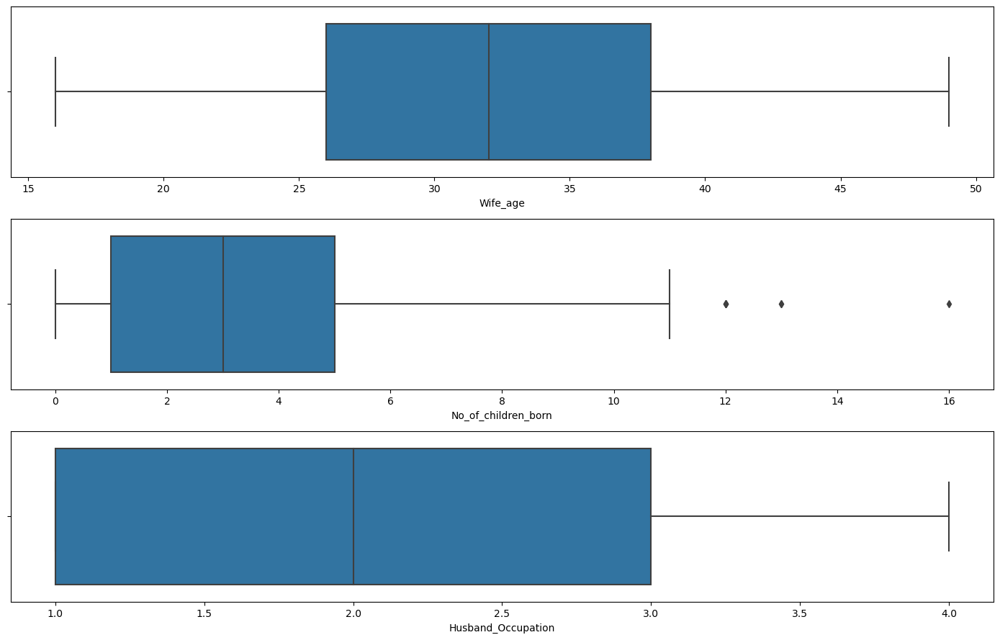

In [271]:
plt.figure(figsize = (14,9))
for i in range(0,len(num_df)):
    plt.subplot(3,1,i+1)
    sns.boxplot(contra_df[num_df[i]])
plt.tight_layout()

In [272]:
def outlier_fix(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [273]:
cont=contra_df.dtypes[(contra_df.dtypes!='object')].index
for column in contra_df[cont].columns:
    lr,ur=outlier_fix(contra_df[column])
    contra_df[column]=np.where(contra_df[column]>ur,ur,contra_df[column])
    contra_df[column]=np.where(contra_df[column]<lr,lr,contra_df[column])

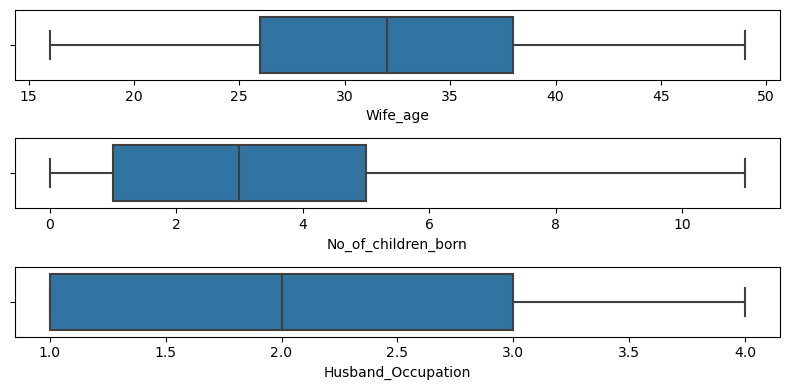

In [275]:
plt.figure(figsize = (8,4))
for i in range(0,len(num_df)):
    plt.subplot(3,1,i+1)
    sns.boxplot(contra_df[num_df[i]])
plt.tight_layout()

In [277]:
contra_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Wife_age,1388.0,32.533862,8.102151,16.0,26.0,32.0,38.0,49.0
No_of_children_born,1388.0,3.278098,2.349532,0.0,1.0,3.0,5.0,11.0
Husband_Occupation,1388.0,2.177954,0.853782,1.0,1.0,2.0,3.0,4.0


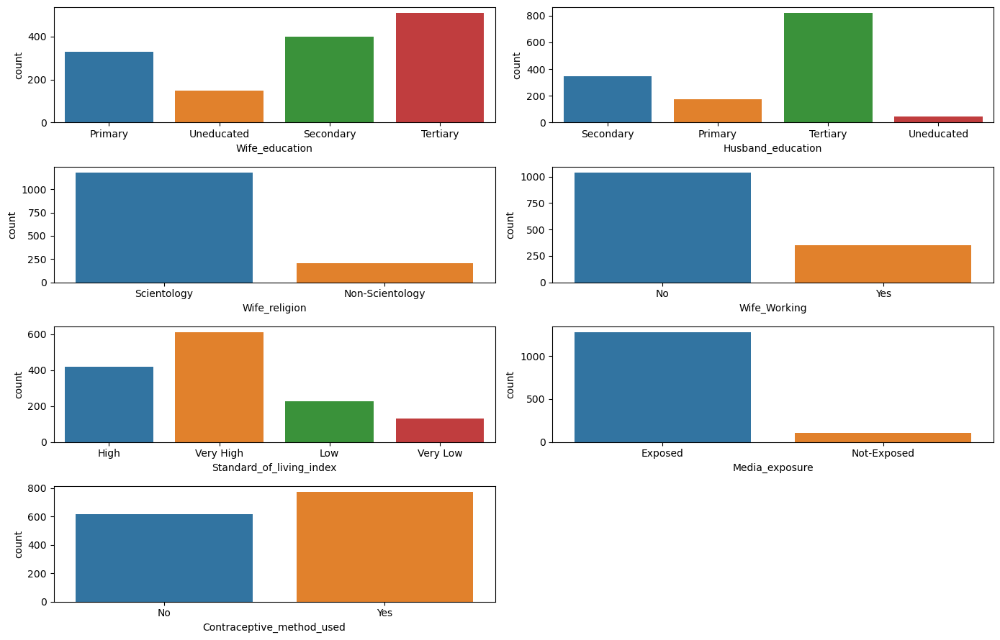

In [279]:
plt.figure(figsize = (14,9))
for i in range(0,len(obj_df)):
    plt.subplot(4,2,i+1)
    sns.countplot(contra_df[obj_df[i]])
plt.tight_layout()

### Bivariate Analysis and Multi-variate Analysis

<Figure size 1000x500 with 0 Axes>

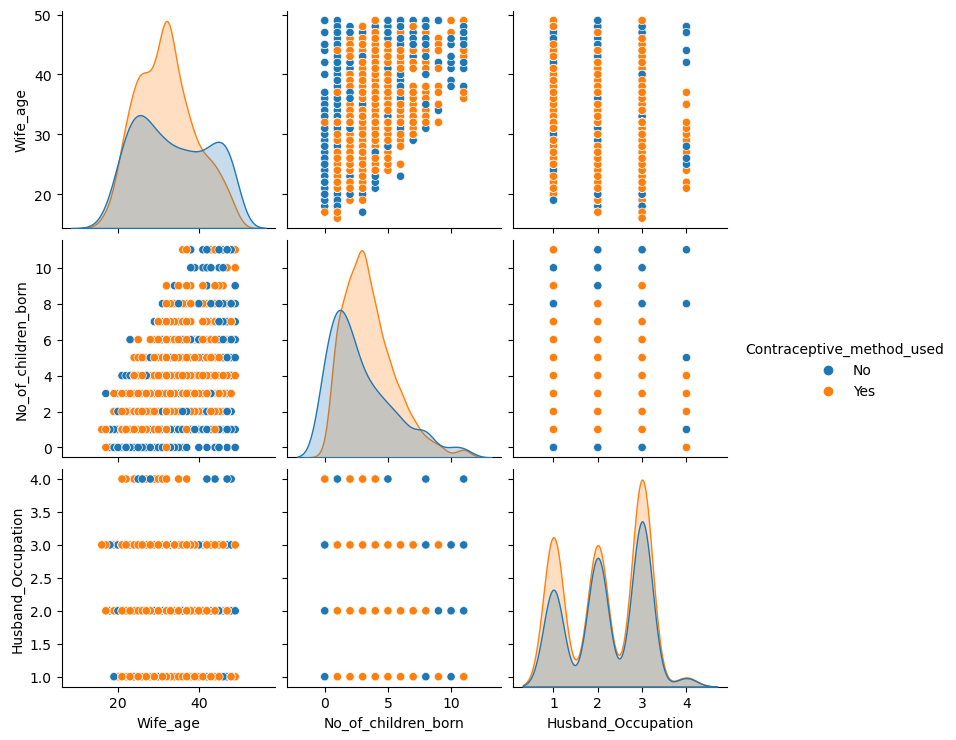

In [285]:
plt.figure(figsize = (10,5))
sns.pairplot(
    contra_df, diag_kind="kde",hue='Contraceptive_method_used'
)  

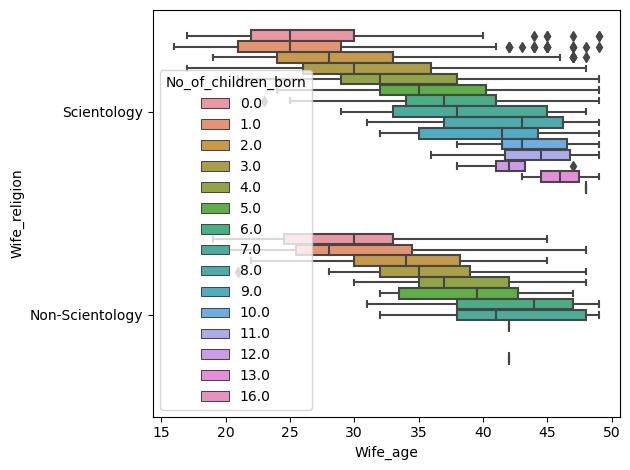

In [26]:
sns.boxplot(data=contra_df,x='Wife_age',hue='No_of_children_born',y='Wife_religion')
plt.tight_layout()

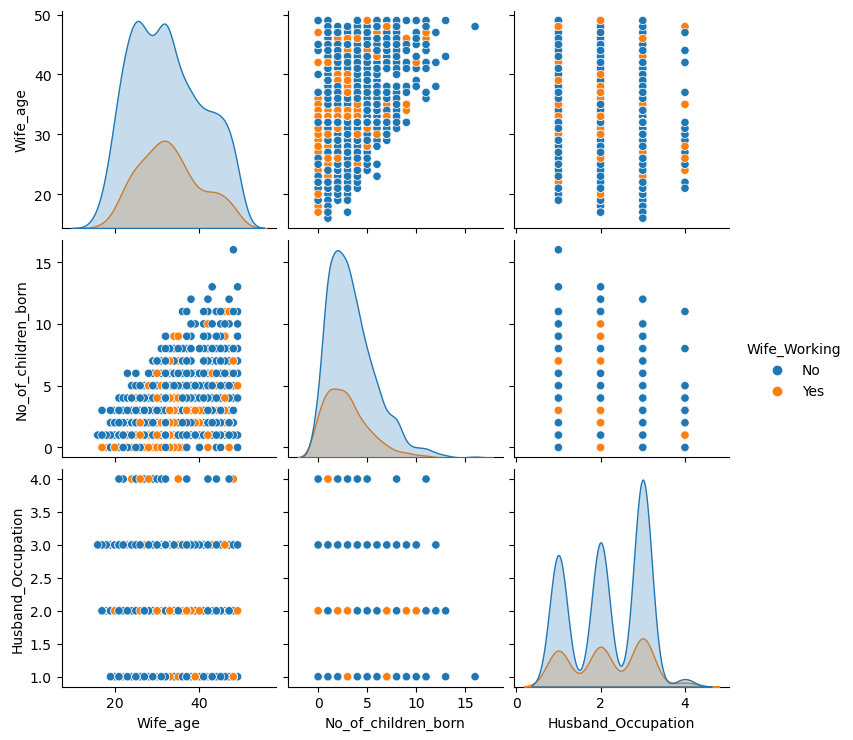

In [27]:
sns.pairplot(
    contra_df, diag_kind="kde",hue='Wife_Working'
)  

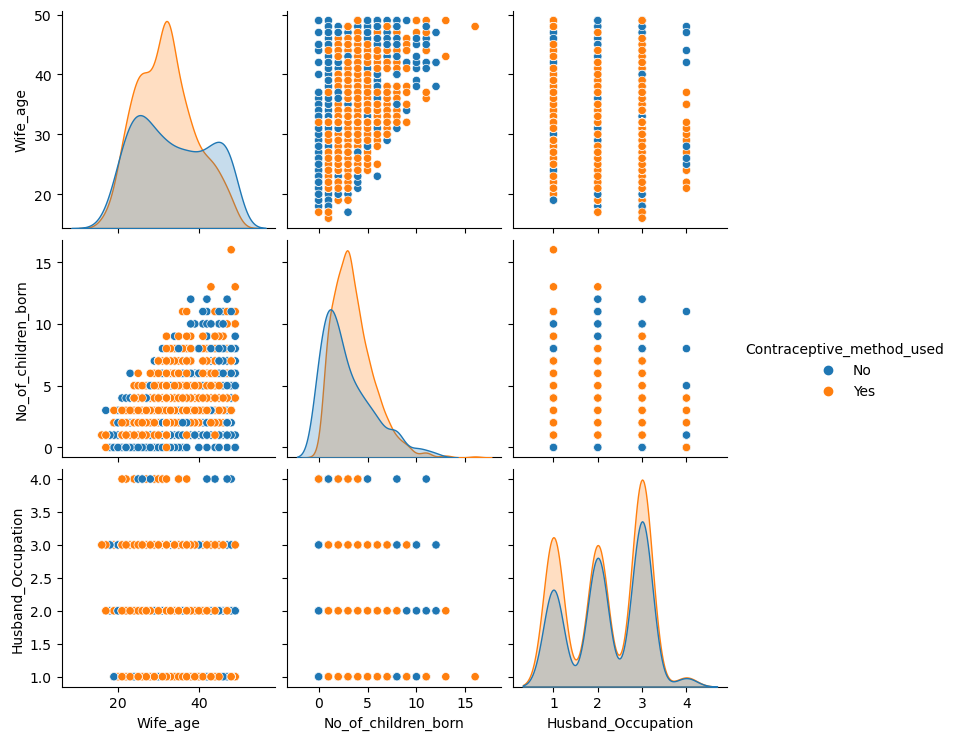

In [28]:
sns.pairplot(
    contra_df, diag_kind="kde",hue='Contraceptive_method_used'
)  

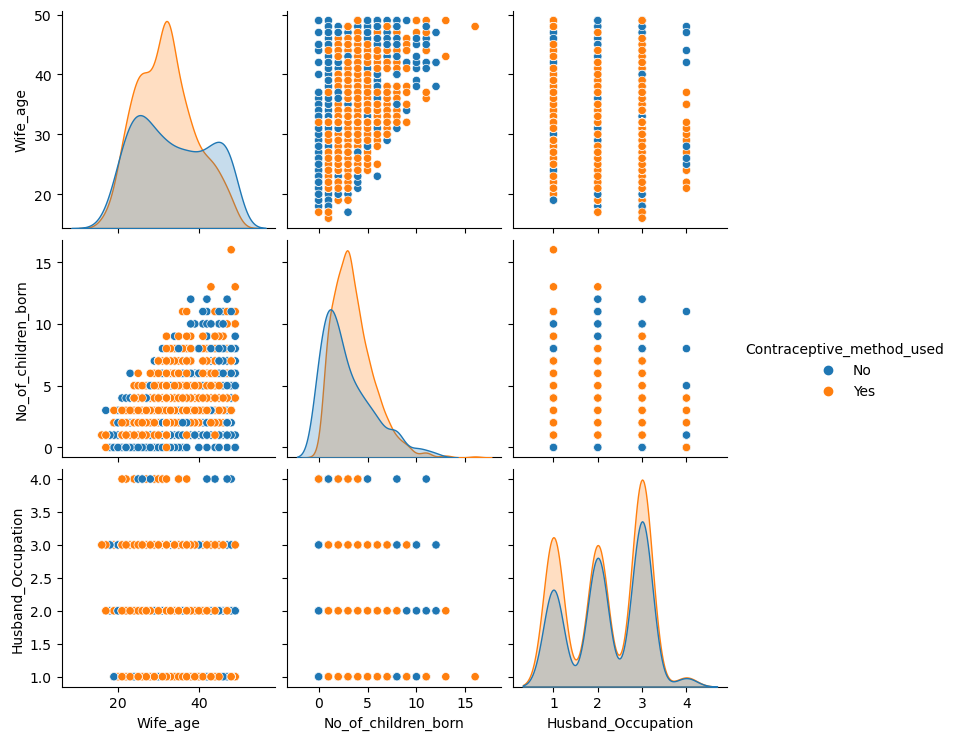

In [29]:
sns.pairplot(
    contra_df, diag_kind="kde",hue='Contraceptive_method_used'
)  

<AxesSubplot:>

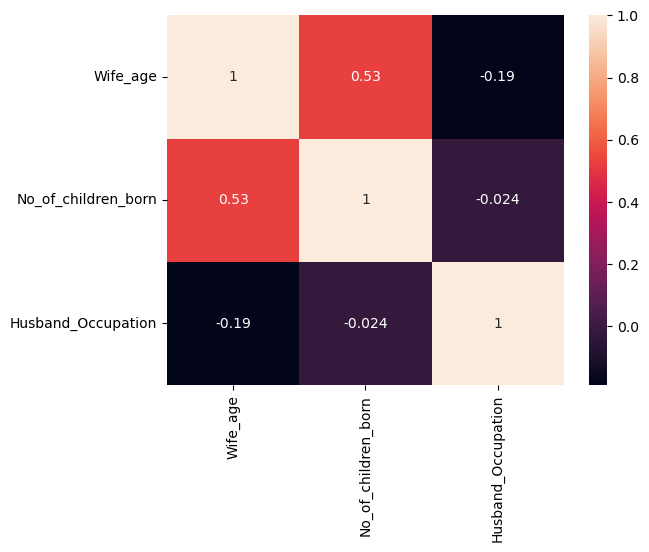

In [27]:
sns.heatmap(contra_df.corr(),annot=True)

<AxesSubplot:title={'center':'No of Children born vs Wife Education'}, xlabel='No_of_children_born', ylabel='Wife_education'>

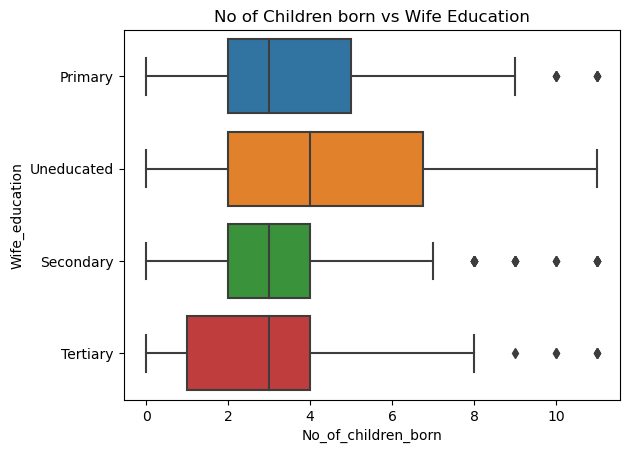

In [288]:
plt.title('No of Children born vs Wife Education')
sns.boxplot(data=contra_df,x='No_of_children_born', y = 'Wife_education')

<AxesSubplot:title={'center':'No of Children born vs Wife Education'}, xlabel='No_of_children_born', ylabel='Contraceptive_method_used'>

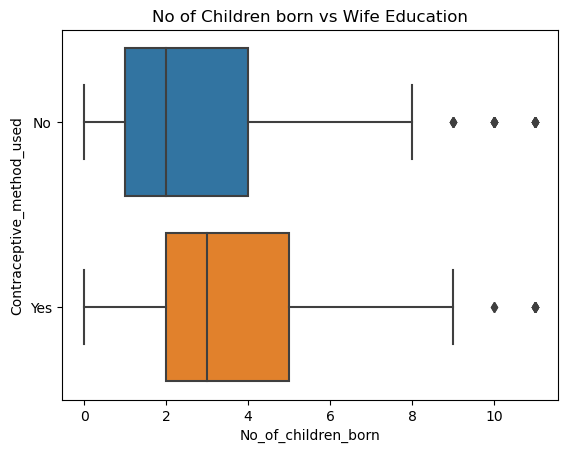

In [291]:
plt.title('No of Children born vs Wife Education')
sns.boxplot(data=contra_df,x='No_of_children_born', y = 'Contraceptive_method_used')

<AxesSubplot:title={'center':'No of Children born vs Wife_religion'}, xlabel='No_of_children_born', ylabel='Wife_religion'>

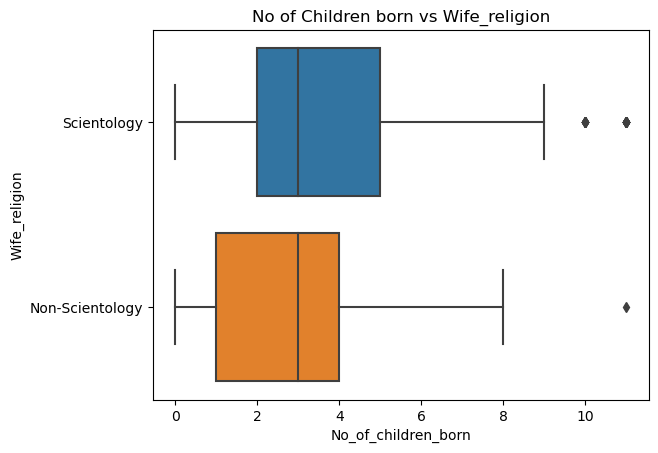

In [293]:
plt.title('No of Children born vs Wife_religion')
sns.boxplot(data=contra_df,x='No_of_children_born', y = 'Wife_religion')

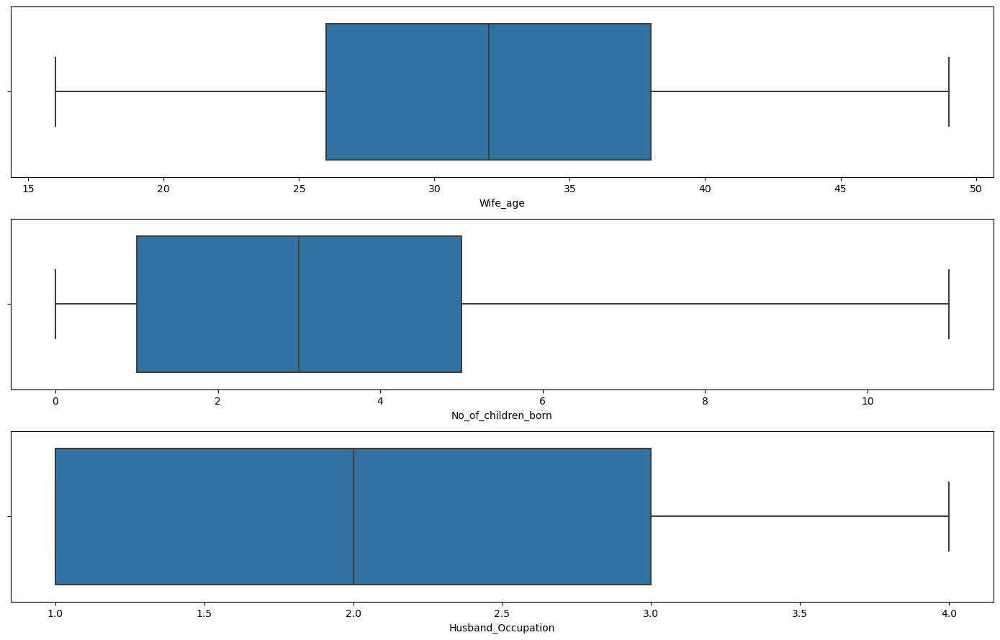

In [30]:
plt.figure(figsize = (14,9))
for i in range(0,len(num_df)):
    plt.subplot(3,1,i+1)
    sns.boxplot(contra_df[num_df[i]])
plt.tight_layout()
# After outlier check 

<AxesSubplot:title={'center':'Wife age  vs Contraceptive'}, xlabel='Wife_age', ylabel='Contraceptive_method_used'>

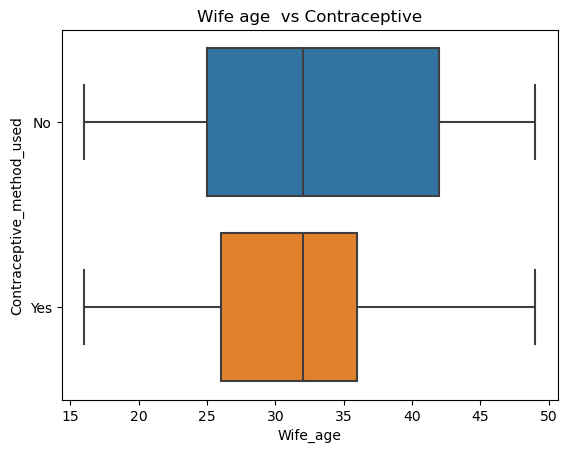

In [294]:
plt.title('Wife age  vs Contraceptive')
sns.boxplot(data=contra_df,x='Wife_age', y = 'Contraceptive_method_used')

## 2.2 Do not scale the data. Encode the data (having string values) for Modelling. Data Split: Split the data into train and test (70:30). Apply Logistic Regression and LDA (linear discriminant analysis) and CART.

###### Encodeing the data

In [295]:
contra_df['Wife_education']= contra_df['Wife_education'].replace({'Uneducated':1,'Primary':2,'Secondary':3,'Tertiary':4})

In [296]:
contra_df['Husband_education']= contra_df['Husband_education'].replace({'Uneducated':1,'Primary':2,'Secondary':3,'Tertiary':4})

In [297]:
contra_df['Wife_religion']= contra_df['Wife_religion'].replace({'Non-Scientology':0, 'Scientology':1})

In [298]:
contra_df['Wife_Working']= contra_df['Wife_Working'].replace({'No':0, 'Yes':1})

In [299]:
contra_df['Standard_of_living_index']= contra_df['Standard_of_living_index'].replace({'Very Low':1, 'Low':2,'High':3,'Very High':4})

In [300]:
contra_df['Media_exposure']= contra_df['Media_exposure'].replace({'Not-Exposed':0, 'Exposed':1})

In [301]:
contra_df['Contraceptive_method_used']= contra_df['Contraceptive_method_used'].replace({'No':0, 'Yes':1})

In [302]:
contra_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1388 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1388 non-null   float64
 1   Wife_education             1388 non-null   int64  
 2   Husband_education          1388 non-null   int64  
 3   No_of_children_born        1388 non-null   float64
 4   Wife_religion              1388 non-null   int64  
 5   Wife_Working               1388 non-null   int64  
 6   Husband_Occupation         1388 non-null   float64
 7   Standard_of_living_index   1388 non-null   int64  
 8   Media_exposure             1388 non-null   int64  
 9   Contraceptive_method_used  1388 non-null   int64  
dtypes: float64(3), int64(7)
memory usage: 119.3 KB


In [303]:
num_df_encode = contra_df.select_dtypes(['int64']).columns

In [304]:
for i in range(0,len(num_df_encode)):
    print(contra_df[num_df_encode[i]].value_counts())
    print('\n')

4    510
3    398
2    330
1    150
Name: Wife_education, dtype: int64


4    822
3    347
2    175
1     44
Name: Husband_education, dtype: int64


1    1182
0     206
Name: Wife_religion, dtype: int64


0    1040
1     348
Name: Wife_Working, dtype: int64


4    613
3    419
2    227
1    129
Name: Standard_of_living_index, dtype: int64


1    1279
0     109
Name: Media_exposure, dtype: int64


1    774
0    614
Name: Contraceptive_method_used, dtype: int64




###### Data Split: Split the data into train and test (70:30)

In [305]:
from sklearn.model_selection import train_test_split

In [306]:
X = contra_df.drop('Contraceptive_method_used', axis=1)

In [307]:
Y = contra_df['Contraceptive_method_used']

In [308]:
Y.value_counts(normalize=True)

1    0.557637
0    0.442363
Name: Contraceptive_method_used, dtype: float64

In [309]:
X_train,X_test,Y_train,Y_test =  train_test_split(X,Y,test_size=0.30, random_state=1,stratify=Y)

In [310]:
X_train

,Wife_age,Wife_education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure
1411,32.0,4,4,2.0,1,0,2.0,3,1
976,29.0,2,3,3.0,1,1,3.0,2,1
1007,31.0,3,4,2.0,1,0,3.0,3,1
452,25.0,3,3,1.0,1,0,3.0,1,1
206,26.0,2,4,0.0,1,0,3.0,1,1
...,...,...,...,...,...,...,...,...,...
148,32.0,4,4,1.0,1,1,1.0,3,1
39,28.0,2,2,1.0,1,0,2.0,4,1
1100,24.0,4,4,1.0,1,1,1.0,3,1
1402,32.0,3,4,2.0,1,0,3.0,3,1


In [311]:
Y_train.value_counts(normalize=True)

1    0.557158
0    0.442842
Name: Contraceptive_method_used, dtype: float64

In [312]:
Y_test.value_counts(normalize=True)

1    0.558753
0    0.441247
Name: Contraceptive_method_used, dtype: float64

###### Stratify = Y is used so the  Yes and No proportions for the dependent variable 'Contraceptive_method_used' is maintained in test and train data 

### Logistic Regression

In [313]:
from sklearn.linear_model import LogisticRegression

In [314]:
from sklearn import metrics

In [315]:
model = LogisticRegression()
model.fit(X_train, Y_train)
y_predict = model.predict(X_test)
model_score = model.score(X_test, Y_test)
print(model_score)
print(metrics.confusion_matrix(Y_test, y_predict))
print(metrics.classification_report(Y_test, y_predict))

0.6498800959232613
[[ 86  98]
 [ 48 185]]
              precision    recall  f1-score   support

           0       0.64      0.47      0.54       184
           1       0.65      0.79      0.72       233

    accuracy                           0.65       417
   macro avg       0.65      0.63      0.63       417
weighted avg       0.65      0.65      0.64       417



In [326]:
y_predict_Train = model.predict(X_train)
print(metrics.classification_report(Y_train, y_predict_Train))

              precision    recall  f1-score   support

           0       0.66      0.52      0.58       430
           1       0.67      0.79      0.73       541

    accuracy                           0.67       971
   macro avg       0.67      0.65      0.65       971
weighted avg       0.67      0.67      0.66       971



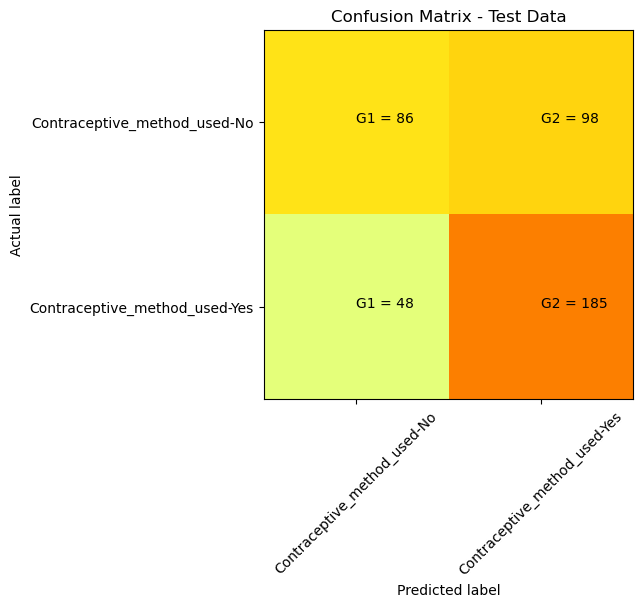

In [316]:
cm = metrics.confusion_matrix(Y_test, y_predict)
plt.clf()
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Wistia)
classNames = ['Contraceptive_method_used-No', 'Contraceptive_method_used-Yes']
plt.title('Confusion Matrix - Test Data')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
tick_marks = np.arange(len(classNames))
plt.xticks(tick_marks, classNames, rotation=45)
plt.yticks(tick_marks, classNames)
s = [['G1', 'G2'], ['G1','G2']]
 
for i in range(2):
    for j in range(2):
        plt.text(j,i, str(s[i][j])+" = "+str(cm[i][j]))
plt.show()

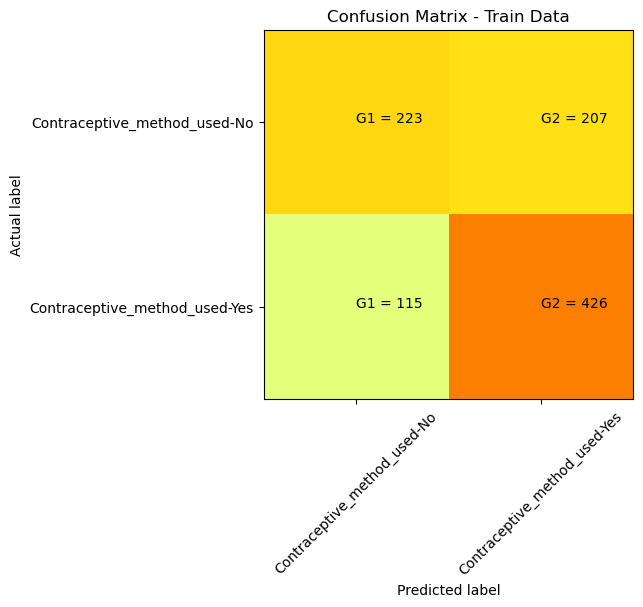

In [328]:
cm = metrics.confusion_matrix(Y_train, y_predict_Train)
plt.clf()
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Wistia)
classNames = ['Contraceptive_method_used-No', 'Contraceptive_method_used-Yes']
plt.title('Confusion Matrix - Train Data')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
tick_marks = np.arange(len(classNames))
plt.xticks(tick_marks, classNames, rotation=45)
plt.yticks(tick_marks, classNames)
s = [['G1', 'G2'], ['G1','G2']]
 
for i in range(2):
    for j in range(2):
        plt.text(j,i, str(s[i][j])+" = "+str(cm[i][j]))
plt.show()

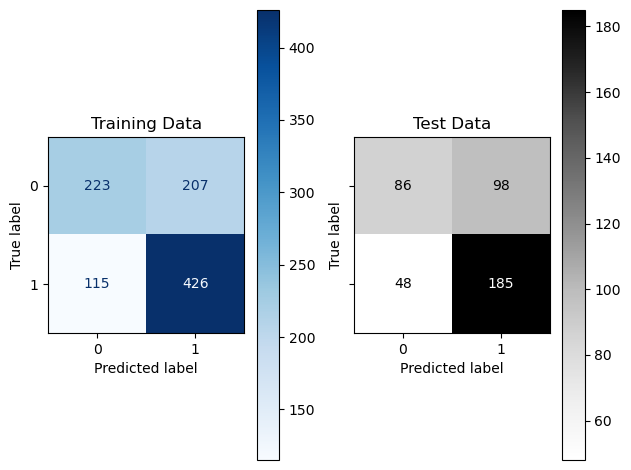

In [340]:
from sklearn.metrics import plot_confusion_matrix
f,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False)

#Plotting confusion matrix for the different models for the Training Data

plot_0 = plot_confusion_matrix(model,X_train,Y_train,ax=a[0][0],cmap='Blues');
a[0][0].set_title('Training Data')

plot_1 = plot_confusion_matrix(model,X_test,Y_test,ax=a[0][1],cmap='Greys');
a[0][1].set_title('Test Data');

plt.tight_layout()

In [364]:
for x,y in zip(X.columns,model.coef_[0]):
    print(x,":",np.round(y,2))

Wife_age : -0.08
Wife_education : 0.51
Husband_education : 0.03
No_of_children_born : 0.33
Wife_religion : -0.49
Wife_Working : -0.2
Husband_Occupation : 0.18
Standard_of_living_index : 0.31
Media_exposure : 0.36


### LDA

In [341]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
clf = LinearDiscriminantAnalysis()
model2=clf.fit(X_train,Y_train)

In [342]:
y_pred_train = model2.predict(X_train)

# Test Data Class Prediction with a cut-off value of 0.5
y_pred_test = model2.predict(X_test)

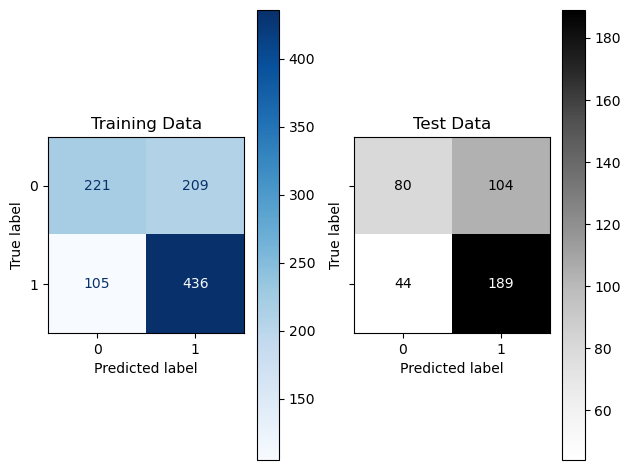

In [344]:
from sklearn.metrics import plot_confusion_matrix
f,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False)

#Plotting confusion matrix for the different models for the Training Data

plot_0 = plot_confusion_matrix(clf,X_train,Y_train,ax=a[0][0],cmap='Blues');
a[0][0].set_title('Training Data')

plot_1 = plot_confusion_matrix(clf,X_test,Y_test,ax=a[0][1],cmap='Greys');
a[0][1].set_title('Test Data');

plt.tight_layout()

In [345]:
print('Classification Report of the training data:\n\n',metrics.classification_report(Y_train,y_pred_train),'\n')
print('Classification Report of the test data:\n\n',metrics.classification_report(Y_test,y_pred_test),'\n')

Classification Report of the training data:

               precision    recall  f1-score   support

           0       0.68      0.51      0.58       430
           1       0.68      0.81      0.74       541

    accuracy                           0.68       971
   macro avg       0.68      0.66      0.66       971
weighted avg       0.68      0.68      0.67       971
 

Classification Report of the test data:

               precision    recall  f1-score   support

           0       0.65      0.43      0.52       184
           1       0.65      0.81      0.72       233

    accuracy                           0.65       417
   macro avg       0.65      0.62      0.62       417
weighted avg       0.65      0.65      0.63       417
 



In [360]:
for x,y in zip(X.columns,model2.coef_[0]):
    print(x,":",np.round(y,2))

Wife_age : -0.08
Wife_education : 0.5
Husband_education : 0.02
No_of_children_born : 0.32
Wife_religion : -0.51
Wife_Working : -0.19
Husband_Occupation : 0.18
Standard_of_living_index : 0.32
Media_exposure : 0.39


### CART

In [346]:
from sklearn.tree import DecisionTreeClassifier
model3 = DecisionTreeClassifier(criterion = 'gini', random_state=1)
model3.fit(X_train, Y_train)

DecisionTreeClassifier(random_state=1)

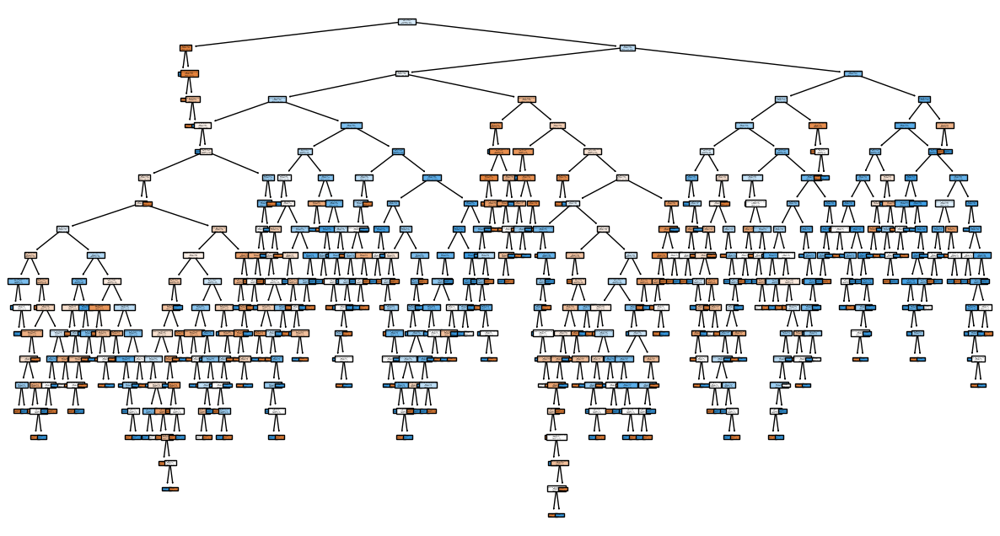

In [347]:
from sklearn import tree
fig = plt.figure(figsize=(15,8))
tree_diag = tree.plot_tree(model3, 
                   feature_names=X_train.columns,
                   filled=True)

In [363]:
print (pd.DataFrame(model3.feature_importances_, columns = ["Importance"], index = X_train.columns).sort_values('Importance',ascending=False))

                          Importance
Wife_age                    0.328187
No_of_children_born         0.246930
Wife_education              0.106439
Husband_Occupation          0.080228
Standard_of_living_index    0.072396
Husband_education           0.063915
Wife_Working                0.055484
Wife_religion               0.034044
Media_exposure              0.012376


In [349]:
y_pred_train_cart = model3.predict(X_train)

# Test Data Class Prediction with a cut-off value of 0.5
y_pred_test_cart = model3.predict(X_test)

In [350]:
print('Classification Report of the training data:\n\n',metrics.classification_report(Y_train,y_pred_train_cart),'\n')
print('Classification Report of the test data:\n\n',metrics.classification_report(Y_test,y_pred_test_cart),'\n')

Classification Report of the training data:

               precision    recall  f1-score   support

           0       0.98      1.00      0.99       430
           1       1.00      0.98      0.99       541

    accuracy                           0.99       971
   macro avg       0.99      0.99      0.99       971
weighted avg       0.99      0.99      0.99       971
 

Classification Report of the test data:

               precision    recall  f1-score   support

           0       0.54      0.54      0.54       184
           1       0.64      0.63      0.63       233

    accuracy                           0.59       417
   macro avg       0.59      0.59      0.59       417
weighted avg       0.59      0.59      0.59       417
 



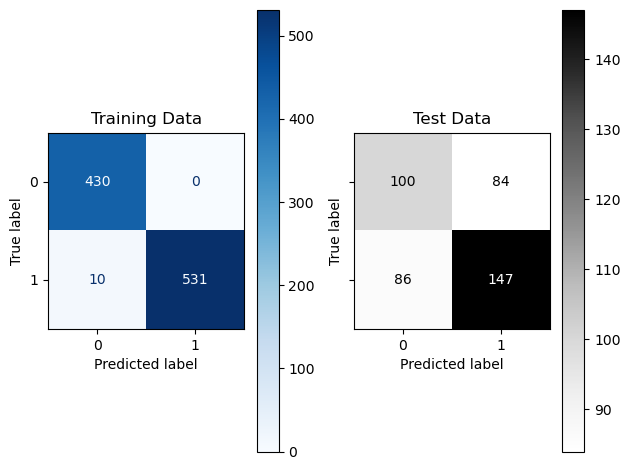

In [351]:
from sklearn.metrics import plot_confusion_matrix
f,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False)

#Plotting confusion matrix for the different models for the Training Data

plot_0 = plot_confusion_matrix(model3,X_train,Y_train,ax=a[0][0],cmap='Blues');
a[0][0].set_title('Training Data')

plot_1 = plot_confusion_matrix(model3,X_test,Y_test,ax=a[0][1],cmap='Greys');
a[0][1].set_title('Test Data');

plt.tight_layout()

In [362]:
print (pd.DataFrame(model3.feature_importances_, columns = ["Imp"], index = X_train.columns))

                               Imp
Wife_age                  0.328187
Wife_education            0.106439
Husband_education         0.063915
No_of_children_born       0.246930
Wife_religion             0.034044
Wife_Working              0.055484
Husband_Occupation        0.080228
Standard_of_living_index  0.072396
Media_exposure            0.012376


## 2.3 Performance Metrics: Check the performance of Predictions on Train and Test sets using Accuracy, Confusion Matrix, Plot ROC curve and get ROC_AUC score for each model Final Model: Compare Both the models and write inference which model is best/optimized.

### Logistic Regression 

In [352]:
# Training Data Probability Prediction
pred_prob_train1 = model.predict_proba(X_train)

# Test Data Probability Prediction
pred_prob_test1 = model.predict_proba(X_test)

AUC for the Training Data: 0.719
AUC for the Test Data: 0.663


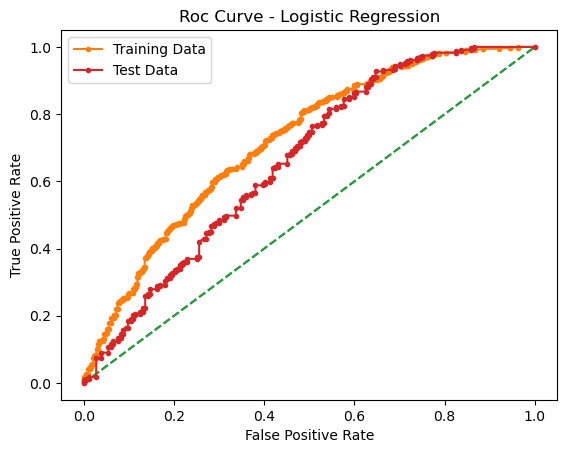

In [354]:
# AUC and ROC for the training data

# calculate AUC
auc = metrics.roc_auc_score(Y_train,pred_prob_train1[:,1])
print('AUC for the Training Data: %.3f' % auc)
plt.title('Roc Curve - Logistic Regression')
#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(Y_train,pred_prob_train1[:,1])
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label = 'Training Data')


# AUC and ROC for the test data

# calculate AUC
auc = metrics.roc_auc_score(Y_test,pred_prob_test1[:,1])
print('AUC for the Test Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(Y_test,pred_prob_test1[:,1])
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label='Test Data')
# show the plot
plt.legend(loc='best')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

### LDA

In [355]:
# Training Data Probability Prediction
pred_prob_train2 = model2.predict_proba(X_train)

# Test Data Probability Prediction
pred_prob_test2 = model2.predict_proba(X_test)

In [357]:
model2

LinearDiscriminantAnalysis()

AUC for the Training Data: 0.719
AUC for the Test Data: 0.662


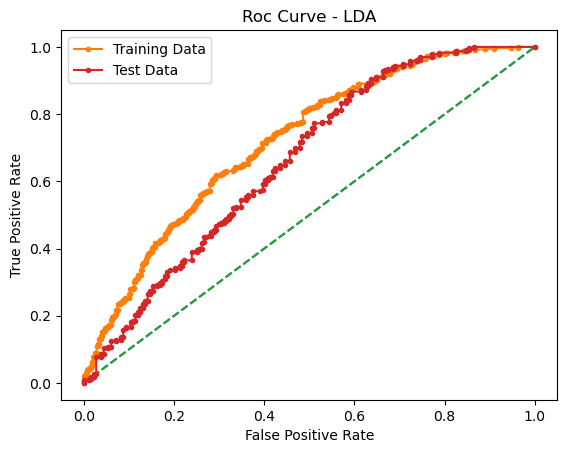

In [356]:
# AUC and ROC for the training data

# calculate AUC
auc = metrics.roc_auc_score(Y_train,pred_prob_train2[:,1])
print('AUC for the Training Data: %.3f' % auc)
plt.title('Roc Curve - LDA')
#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(Y_train,pred_prob_train2[:,1])
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label = 'Training Data')


# AUC and ROC for the test data

# calculate AUC
auc = metrics.roc_auc_score(Y_test,pred_prob_test2[:,1])
print('AUC for the Test Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(Y_test,pred_prob_test2[:,1])
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label='Test Data')
# show the plot
plt.legend(loc='best')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

### CART

In [358]:
# Training Data Probability Prediction
pred_prob_train3 = model3.predict_proba(X_train)

# Test Data Probability Prediction
pred_prob_test3 = model3.predict_proba(X_test)

AUC for the Training Data: 1.000
AUC for the Test Data: 0.590


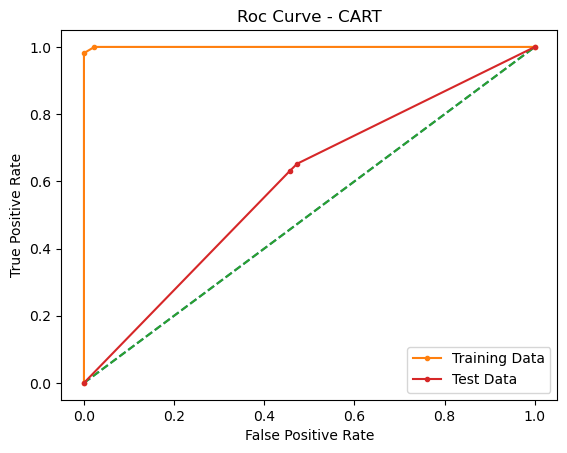

In [359]:
# AUC and ROC for the training data

# calculate AUC
auc = metrics.roc_auc_score(Y_train,pred_prob_train3[:,1])
print('AUC for the Training Data: %.3f' % auc)
plt.title('Roc Curve - CART')
#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(Y_train,pred_prob_train3[:,1])
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label = 'Training Data')


# AUC and ROC for the test data

# calculate AUC
auc = metrics.roc_auc_score(Y_test,pred_prob_test3[:,1])
print('AUC for the Test Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(Y_test,pred_prob_test3[:,1])
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label='Test Data')
# show the plot
plt.legend(loc='best')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

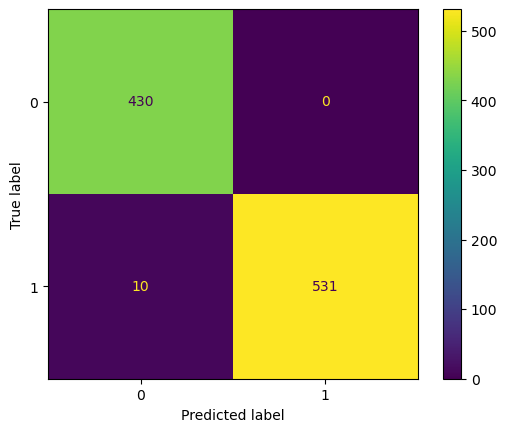

In [67]:
plot_confusion_matrix(model3,X_train ,Y_train)

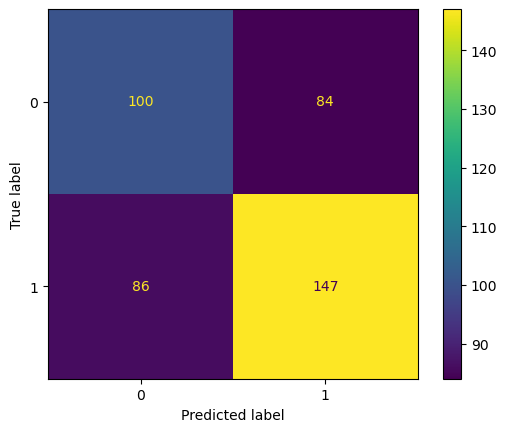

In [68]:
plot_confusion_matrix(model3,X_test ,Y_test)

In [69]:
ytrain_predict_CART = model3.predict(X_train)
ytest_predict_CART = model3.predict(X_test)

In [70]:
# Training Data
model3.score(X_train,Y_train) 

0.9897013388259527

In [72]:
print(metrics.classification_report(Y_train, ytrain_predict_CART))

              precision    recall  f1-score   support

           0       0.98      1.00      0.99       430
           1       1.00      0.98      0.99       541

    accuracy                           0.99       971
   macro avg       0.99      0.99      0.99       971
weighted avg       0.99      0.99      0.99       971



In [73]:
# Test Data
model3.score(X_test,Y_test) 

0.592326139088729

In [74]:
print(metrics.classification_report(Y_test, ytest_predict_CART))

              precision    recall  f1-score   support

           0       0.54      0.54      0.54       184
           1       0.64      0.63      0.63       233

    accuracy                           0.59       417
   macro avg       0.59      0.59      0.59       417
weighted avg       0.59      0.59      0.59       417



## Optimized Model 

In [365]:
from sklearn.model_selection import GridSearchCV

param_grid = {'max_features': ['auto', 'sqrt', 'log2'],
              'ccp_alpha': [0.1, .01, .001],
              'max_depth' : [1,5,10,15,20],
              'min_samples_leaf':[1,5,10,15,20],
              'criterion' :['gini', 'entropy']
             }
tree_clas = DecisionTreeClassifier(random_state=1024)
grid_search = GridSearchCV(estimator=tree_clas, param_grid=param_grid, cv=5, verbose=True)
grid_search.fit(X_train, Y_train)

Fitting 5 folds for each of 450 candidates, totalling 2250 fits


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=1024),
             param_grid={'ccp_alpha': [0.1, 0.01, 0.001],
                         'criterion': ['gini', 'entropy'],
                         'max_depth': [1, 5, 10, 15, 20],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'min_samples_leaf': [1, 5, 10, 15, 20]},
             verbose=True)

In [366]:
grid_search.best_params_

{'ccp_alpha': 0.001,
 'criterion': 'gini',
 'max_depth': 5,
 'max_features': 'auto',
 'min_samples_leaf': 20}

In [367]:
reg_dt_model = DecisionTreeClassifier( ccp_alpha=0.001,criterion='gini', max_depth=5,
                       max_features='auto',min_samples_leaf= 20,
                           random_state=1024)
reg_dt_model.fit(X_train, Y_train)

DecisionTreeClassifier(ccp_alpha=0.001, max_depth=5, max_features='auto',
                       min_samples_leaf=20, random_state=1024)

In [368]:
y_pred_train_reg = reg_dt_model.predict(X_train)

# Test Data Class Prediction with a cut-off value of 0.5
y_pred_test_reg = reg_dt_model.predict(X_test)

In [369]:
print('Classification Report of the training data:\n\n',metrics.classification_report(Y_train,y_pred_train_reg),'\n')
print('Classification Report of the test data:\n\n',metrics.classification_report(Y_test,y_pred_test_reg),'\n')

Classification Report of the training data:

               precision    recall  f1-score   support

           0       0.73      0.51      0.60       430
           1       0.69      0.85      0.76       541

    accuracy                           0.70       971
   macro avg       0.71      0.68      0.68       971
weighted avg       0.71      0.70      0.69       971
 

Classification Report of the test data:

               precision    recall  f1-score   support

           0       0.72      0.45      0.55       184
           1       0.66      0.86      0.75       233

    accuracy                           0.68       417
   macro avg       0.69      0.65      0.65       417
weighted avg       0.69      0.68      0.66       417
 



In [370]:
# Training Data Probability Prediction
pred_prob_train4 = reg_dt_model.predict_proba(X_train)

# Test Data Probability Prediction
pred_prob_test4 = reg_dt_model.predict_proba(X_test)

AUC for the Training Data: 0.756
AUC for the Test Data: 0.685


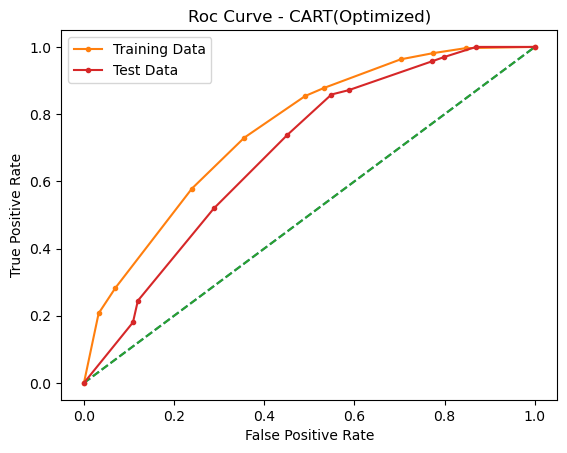

In [371]:
# AUC and ROC for the training data

# calculate AUC
auc = metrics.roc_auc_score(Y_train,pred_prob_train4[:,1])
print('AUC for the Training Data: %.3f' % auc)
plt.title('Roc Curve - CART(Optimized)')
#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(Y_train,pred_prob_train4[:,1])
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label = 'Training Data')


# AUC and ROC for the test data

# calculate AUC
auc = metrics.roc_auc_score(Y_test,pred_prob_test4[:,1])
print('AUC for the Test Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(Y_test,pred_prob_test4[:,1])
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label='Test Data')
# show the plot
plt.legend(loc='best')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

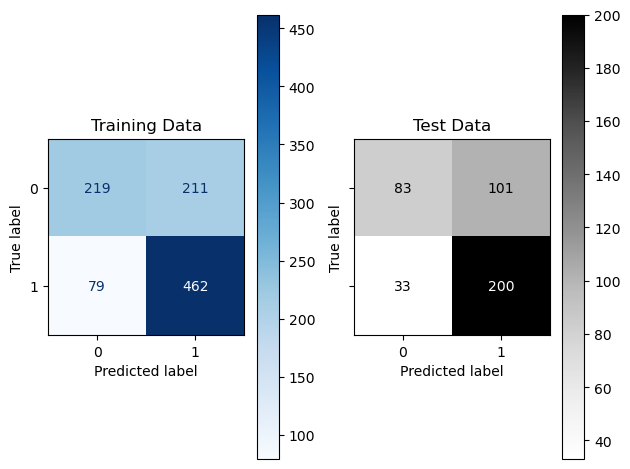

In [372]:

f,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False)

#Plotting confusion matrix for the different models for the Training Data

plot_0 = plot_confusion_matrix(reg_dt_model,X_train,Y_train,ax=a[0][0],cmap='Blues');
a[0][0].set_title('Training Data')

plot_1 = plot_confusion_matrix(reg_dt_model,X_test,Y_test,ax=a[0][1],cmap='Greys');
a[0][1].set_title('Test Data');

plt.tight_layout()

In [390]:
print (pd.DataFrame(reg_dt_model.feature_importances_, columns = ["Imp"], index = X_train.columns))

                               Imp
Wife_age                  0.188133
Wife_education            0.208024
Husband_education         0.000000
No_of_children_born       0.477538
Wife_religion             0.000000
Wife_Working              0.000000
Husband_Occupation        0.000000
Standard_of_living_index  0.053954
Media_exposure            0.072350


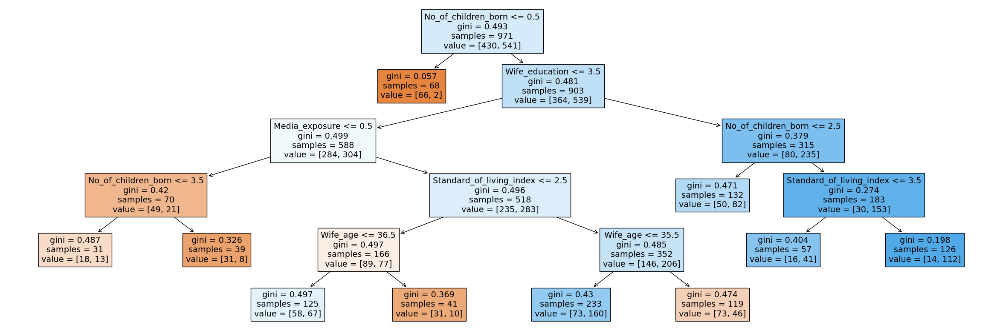

In [391]:
fig = plt.figure(figsize=(30,10))
tree_diag = tree.plot_tree(reg_dt_model, 
                   feature_names=X_train.columns,
                   filled=True)

# HyperParameter Tuning for LDA and Logistic Regression 

In [376]:
from sklearn.model_selection import RepeatedStratifiedKFold
solvers = ['newton-cg', 'lbfgs', 'liblinear']
penalty = ['l2']
c_values = [100, 10, 1.0, 0.1, 0.01]
# define grid search
grid = dict(solver=solvers,penalty=penalty,C=c_values)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(X_train, Y_train)

In [377]:
grid_result.best_params_

{'C': 0.1, 'penalty': 'l2', 'solver': 'newton-cg'}

In [378]:
model5 = LogisticRegression(C=0.1, penalty='l2', solver= 'newton-cg')
model5.fit(X_train, Y_train)

LogisticRegression(C=0.1, solver='newton-cg')

In [379]:
y_pred_train_5 = model5.predict(X_train)

# Test Data Class Prediction with a cut-off value of 0.5
y_pred_test_5 = model5.predict(X_test)

In [380]:
print('Classification Report of the training data:\n\n',metrics.classification_report(Y_train,y_pred_train_5),'\n')
print('Classification Report of the test data:\n\n',metrics.classification_report(Y_test,y_pred_test_5),'\n')

Classification Report of the training data:

               precision    recall  f1-score   support

           0       0.67      0.52      0.59       430
           1       0.68      0.79      0.73       541

    accuracy                           0.67       971
   macro avg       0.67      0.66      0.66       971
weighted avg       0.67      0.67      0.67       971
 

Classification Report of the test data:

               precision    recall  f1-score   support

           0       0.65      0.46      0.54       184
           1       0.66      0.81      0.72       233

    accuracy                           0.65       417
   macro avg       0.65      0.63      0.63       417
weighted avg       0.65      0.65      0.64       417
 



In [ ]:
'svd': Singular value decomposition (default). Does not compute the covariance matrix, therefore this solver is recommended for data with a large number of features.
'lsqr': Least squares solution, can be combined with shrinkage.
'eigen': Eigenvalue decomposition, can be combined with shrinkage.

In [383]:


param_grid = {'solver': ['svd', 'lsqr', 'eigen'],
              'shrinkage': [None] + [x / 10 for x in range(0, 11)] + ['auto'],
              'store_covariance': [True, False],
             
             }
lda = LinearDiscriminantAnalysis()
grid_search = GridSearchCV(estimator=lda, param_grid=param_grid, cv=5, verbose=True)
grid_search.fit(X_train, Y_train)

Fitting 5 folds for each of 78 candidates, totalling 390 fits


GridSearchCV(cv=5, estimator=LinearDiscriminantAnalysis(),
             param_grid={'shrinkage': [None, 0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6,
                                       0.7, 0.8, 0.9, 1.0, 'auto'],
                         'solver': ['svd', 'lsqr', 'eigen'],
                         'store_covariance': [True, False]},
             verbose=True)

In [385]:
grid_search.best_params_

{'shrinkage': None, 'solver': 'svd', 'store_covariance': True}

In [387]:
model6 = LinearDiscriminantAnalysis(shrinkage=None, solver= 'svd', store_covariance= True)
model6.fit(X_train, Y_train)

LinearDiscriminantAnalysis(store_covariance=True)

In [388]:
y_pred_train_6 = model6.predict(X_train)

# Test Data Class Prediction with a cut-off value of 0.5
y_pred_test_6 = model6.predict(X_test)

In [389]:
print('Classification Report of the training data:\n\n',metrics.classification_report(Y_train,y_pred_train_6),'\n')
print('Classification Report of the test data:\n\n',metrics.classification_report(Y_test,y_pred_test_6),'\n')

Classification Report of the training data:

               precision    recall  f1-score   support

           0       0.68      0.51      0.58       430
           1       0.68      0.81      0.74       541

    accuracy                           0.68       971
   macro avg       0.68      0.66      0.66       971
weighted avg       0.68      0.68      0.67       971
 

Classification Report of the test data:

               precision    recall  f1-score   support

           0       0.65      0.43      0.52       184
           1       0.65      0.81      0.72       233

    accuracy                           0.65       417
   macro avg       0.65      0.62      0.62       417
weighted avg       0.65      0.65      0.63       417
 

